# Jane_Pytorch-LSTM-Implementation 🔥

## References

### EDAs
1. <a href="https://www.kaggle.com/carlmcbrideellis/jane-street-eda-of-day-0-and-feature-importance">Jane Street: EDA of day 0 and feature importance</a>

2. <a href="https://www.kaggle.com/muhammadmelsherbini/jane-street-extensive-eda-pca-starter">
Jane_street_Extensive_EDA & PCA starter 📊⚡</a>

3. <a href="https://www.kaggle.com/hamzashabbirbhatti/eda-a-quant-s-prespective">
EDA / A Quant's Prespective</a>

4. <a href="https://www.kaggle.com/gregorycalvez/de-anonymization-time-aggregation-tags">De-anonymization: Time Aggregation Tags</a>

### Feature Engineering

1. <a href="https://www.kaggle.com/gogo827jz/optimise-speed-of-filling-nan-function">Optimise Speed of Filling-NaN Function</a>

2. <a href="https://www.kaggle.com/apolitano20/jane-street-features-hierarchical-clustering">Features Hierarchical Clustering</a>

### Implementing Pytorch-LSTM 🔥

1. <a href="https://www.kaggle.com/omershect/learning-pytorch-lstm-deep-learning-with-m5-data">Learning Pytorch LSTM Deep Learning with M5 Data</a>

2. <a href="https://www.kaggle.com/backtracking/lstm-baseline-pytorch">LSTM-Baseline-Pytorch</a>

## Abstract

This kernel is approach using LSTM via Pytorch. For now when a month left till end of competition, **Most people have focused 'Bottle-Neck AE + MLP with Tuning' Solution for taking 1st place.** Although the situation is like above, **I make a note for LSTM due to my curiosity.**

I have seen some LSTM implements at M5-accurcy competition like my references. And, for adapting it in JaneStreet i read LSTM refs like above. **I really appreciate about their effort what they want to share their experts.**

**In conclusion, first, I have thought this competition is not good for using LSTM.** Because we just get one trade opportunity when we make a prediciton(It's called 'Bottle Neck'). So, There is a problem when we fill null data unlike training data. That's why there is a few rnn and lstm implementations. Even though there is this kind of problem, by stacking last data gradually within sequence length size.

Before doing best solution of this compeition, **I'll do adapt some apporaches for increasing LSTM perfomance as long as I can.** 

**I'll leave comment when I finish to adapt some approaches what I want. :D**

## Timeline

* 2021-01-19

    1. LSTM-pytorch baseline test running for submission (epoch:1; input_dim:130; hidden_dim:256; layer_dim:2)
    2. **[ing~]** Filling NA and oulier preprocessing
    3. **[need to clean up result]** Feature Hierarchical Clustering (Correlation-based distance, Variance of Information, Denoise Large Correlation by Random Matrix Theory)

## Implementation

### Process for Time-Series Data

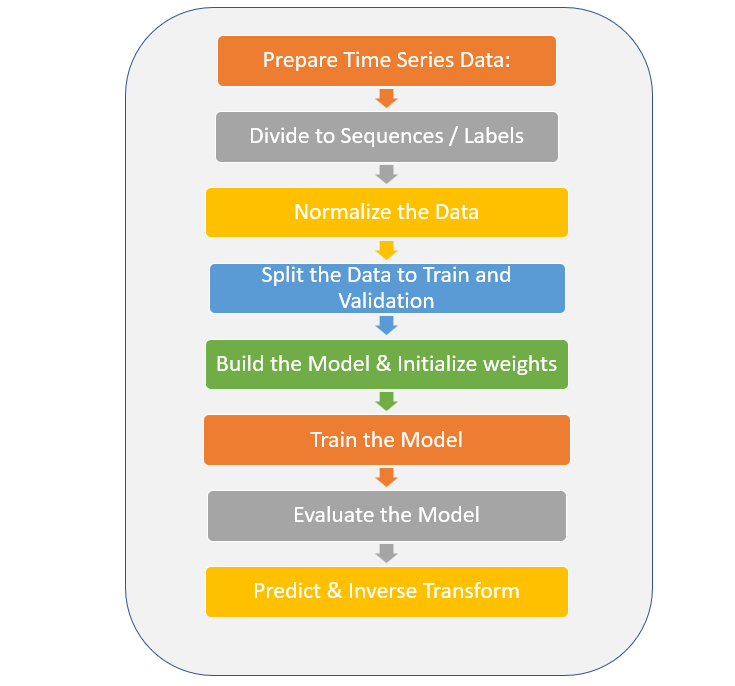

### Import packages and dataset

In [6]:
import warnings
import os 

from collections import defaultdict
from copy import deepcopy

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm_notebook

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn import functional as F

# install datatable
!pip install datatable
import datatable as dt

import gc

warnings.simplefilter(action="ignore")

project_home = "/kaggle/input/jane-street-market-prediction"

In [7]:
train_file = os.path.join(project_home,'train.csv')
features_file = os.path.join(project_home,'features.csv')
example_test_file = os.path.join(project_home,'example_test.csv')
example_sample_submission_file = os.path.join(project_home,'example_sample_submission.csv')

train_data_datatable = dt.fread(train_file)

df_train = train_data_datatable.to_pandas()
df_features = pd.read_csv(features_file)
df_example_test = pd.read_csv(example_test_file)
df_example_sample_submission = pd.read_csv(example_sample_submission_file)

In [156]:
features = [ col for col in df_train.columns if "feature" in col ]
resps = [ col for col in df_train.columns if "resp" in col ]
target_resp = [resp_ for resp_ in resps if "_" not in resp_]
target = ["weight"] + target_resp + features 

### Reduce Memory Usage

We need to reduce memory usage because our dataset is too huge.

In [8]:
## Reduce Memory

start_mem = df_train.memory_usage().sum() / 1024 ** 2

mem_dict = defaultdict(list)
mem_dict["int8"].append("feature_0") 
mem_dict["int16"].append("date") 
mem_dict["int32"].append("ts_id")

for i in df_train:
    if df_train[i].dtype == np.float64:
        if (((df_train[i] < .0001) & (df_train[i] > -.0001)).mean()) > .001:
            mem_dict["float64"].append(i)
        else:
            mem_dict["float32"].append(i)

for key, values in mem_dict.items():
    for col in values:
        if key == "int8":
            df_train[col] = df_train[col].astype(np.int8)

        elif key == "int16":
            df_train[col] = df_train[col].astype(np.int16)

        elif key == "int32":
            df_train[col] = df_train[col].astype(np.int32)

        elif key == "float32":
            df_train[col] = df_train[col].astype(np.float32) 

        elif key == "float64":
            df_train[col] = df_train[col].astype(np.float64)

end_mem = df_train.memory_usage().sum() / 1024 ** 2

print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))

df_train.info()

Mem. usage decreased to 1301.74 Mb (47.7% reduction)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2390491 entries, 0 to 2390490
Columns: 138 entries, date to ts_id
dtypes: float32(129), float64(6), int16(1), int32(1), int8(1)
memory usage: 1.3 GB


### Feature Engineering

1. Filling NaN Values 

    https://www.kaggle.com/gogo827jz/optimise-speed-of-filling-nan-function

2. Clustering using features

    https://www.kaggle.com/apolitano20/jane-street-features-hierarchical-clustering

3. Making Rolling Features

    https://www.kaggle.com/lucasmorin/running-algos-fe-for-fast-inference



#### 1. Fill NaN values

In [108]:
def chunks(l, n):
    """ Yield n successive chunks from l.
    """
    newn = int(len(l) / n)
    for i in range(0, n-1):
        yield l[i*newn:i*newn+newn]
    yield l[n*newn-newn:]

In [99]:
#count
nan_values_train = (df_train
 .apply(lambda x: x.isna().sum(axis = 0)/len(df_train))
 .to_frame()
 .rename(columns = {0: 'percentage_nan_values'})
.sort_values('percentage_nan_values', ascending = False)
)

display((df_train
 .apply(lambda x: x.isna().sum(axis = 0))
 .to_frame()
 .rename(columns = {0: 'count_nan_values'})
.sort_values('count_nan_values', ascending = False)
.transpose()), nan_values_train.transpose(),
       print("Number of features with at least one NaN value: {}/{}".format(len(nan_values_train.query('percentage_nan_values>0')),
                                                                           len(df_train.columns))))

Number of features with at least one NaN value: 88/138


,feature_17,feature_27,feature_28,feature_18,feature_7,feature_8,feature_108,feature_84,feature_102,feature_72,...,feature_63,weight,feature_61,feature_60,feature_57,feature_54,feature_53,feature_52,feature_51,ts_id
count_nan_values,395535,395535,395535,395535,393135,393135,351426,351426,351426,351426,...,0,0,0,0,0,0,0,0,0,0


,feature_17,feature_27,feature_28,feature_18,feature_7,feature_8,feature_108,feature_84,feature_102,feature_72,...,feature_63,weight,feature_61,feature_60,feature_57,feature_54,feature_53,feature_52,feature_51,ts_id
percentage_nan_values,0.165462,0.165462,0.165462,0.165462,0.164458,0.164458,0.14701,0.14701,0.14701,0.14701,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


None

Text(0.5, 1.0, 'Top 40 Features for percentage of NaN Values')

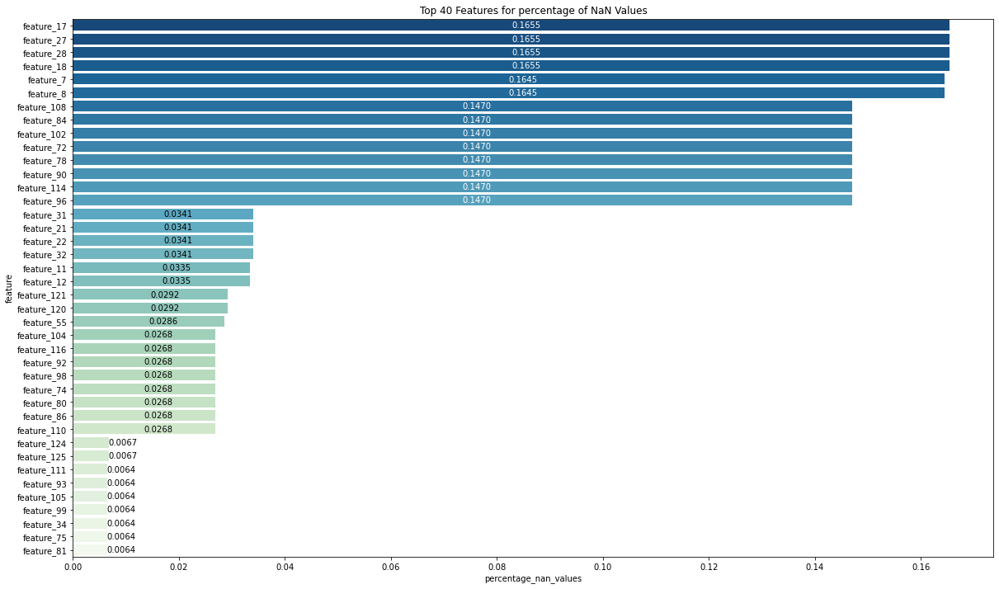

In [100]:
fig, ax = plt.subplots(figsize = (20, 12))

sns.set_palette("RdBu", 10)
#RdBu, YlGn
ax = sns.barplot(x='percentage_nan_values', 
            y='feature', 
            palette = 'GnBu_r',
            data=nan_values_train.reset_index().rename(columns = {'index': 'feature'}).head(40))

for p in ax.patches:
    width = p.get_width() 
    if width < 0.01:# get bar length
        ax.text(width,       # set the text at 1 unit right of the bar
            p.get_y() + p.get_height() / 2, # get Y coordinate + X coordinate / 2
            '{:1.4f}'.format(width), # set variable to display, 2 decimals
            ha = 'left',   # horizontal alignment
            va = 'center')  # vertical alignment
    else:
        if width < 0.04:
            color_text = 'black'
        else:
            color_text = 'white'
        ax.text(width /2, 
                # set the text at 1 unit right of the bar
            p.get_y() + p.get_height() / 2, # get Y coordinate + X coordinate / 2
            '{:1.4f}'.format(width), # set variable to display, 2 decimals
            ha = 'left',   # horizontal alignment
            va = 'center',
            color = color_text,
            fontsize = 10)  # vertical alignment

ax.set_title('Top 40 Features for percentage of NaN Values')

In [114]:
df_plt_train = df_train.copy()
df_plt_train['daily_ts_id'] = (df_plt_train.groupby('date').cumcount())

In [115]:
top_nan_features = nan_values_train.head(40).index.tolist() #take the first 40 with most nans
features_chunks = chunks(top_nan_features, 20)
mini_df = pd.concat([(df_plt_train[top_nan_features].isna().astype(int)),df_plt_train[['ts_id']]], 1).iloc[:30000, :]
new_day = (df_plt_train.iloc[:30000, :].query("daily_ts_id == 0").ts_id.tolist())

In [116]:
df_plt_train = (df_plt_train.set_index('date').join(df_plt_train.groupby('date').size().reset_index().rename(columns = {0: 'daily_number_of_trades'}).set_index('date'))
        .reset_index())

In [117]:
df_plt_train['pseudo_time_of_day'] = (df_plt_train['daily_ts_id']/df_plt_train['daily_number_of_trades'])
gc.collect()

119410

In [118]:
nan_df = pd.concat([(df_plt_train[top_nan_features].isna().astype(int)), df_plt_train[['pseudo_time_of_day']]], 1)

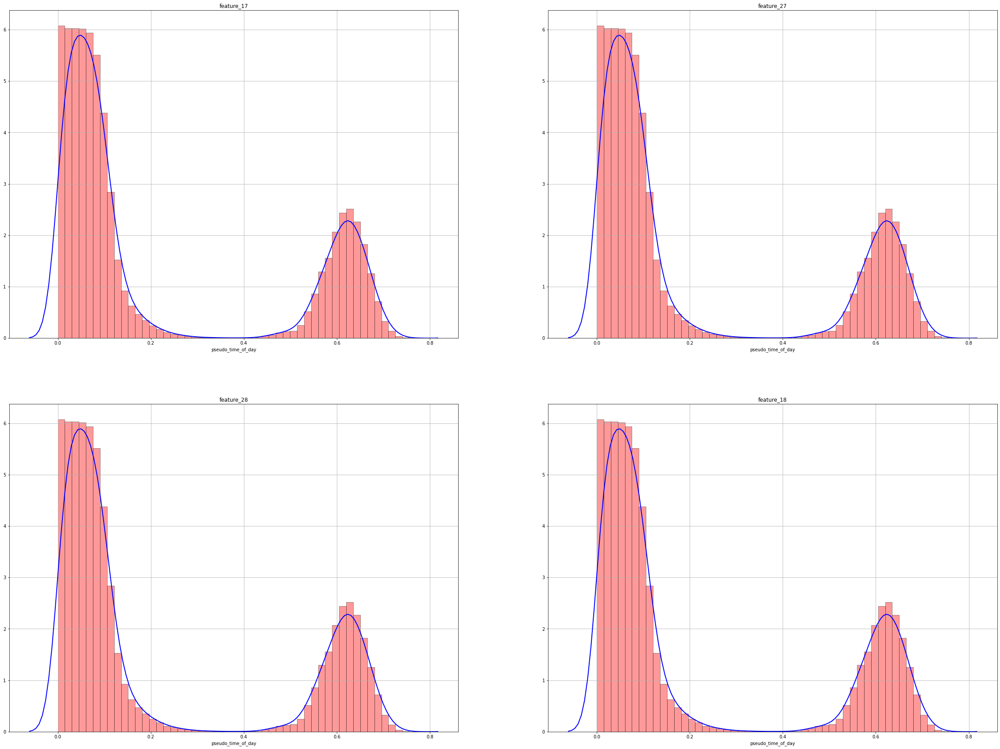

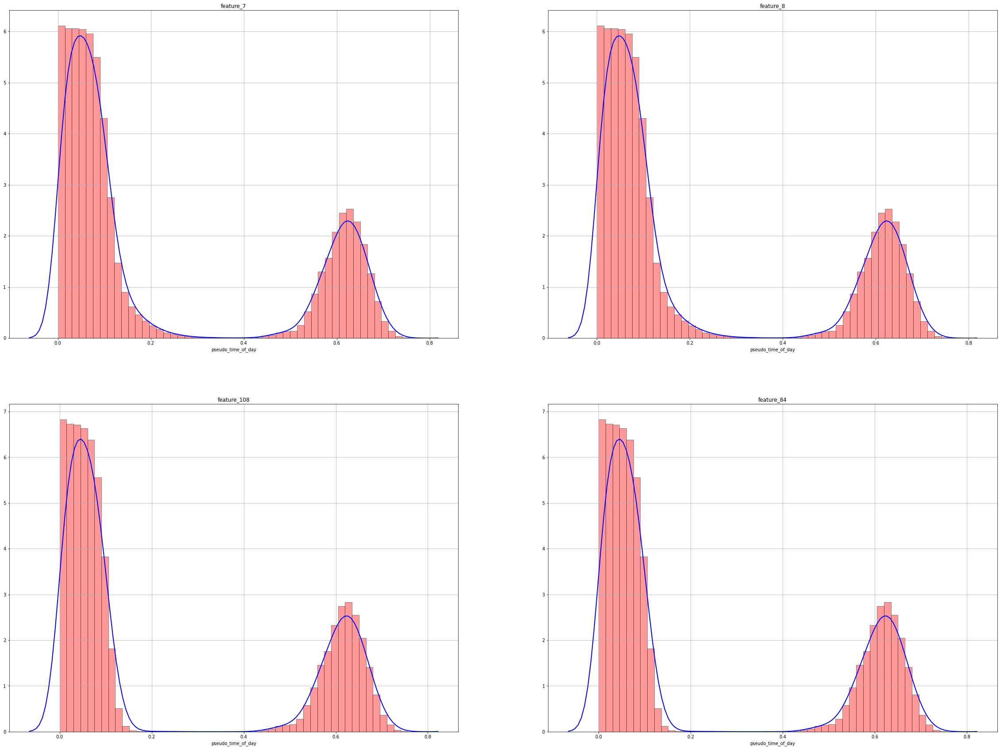

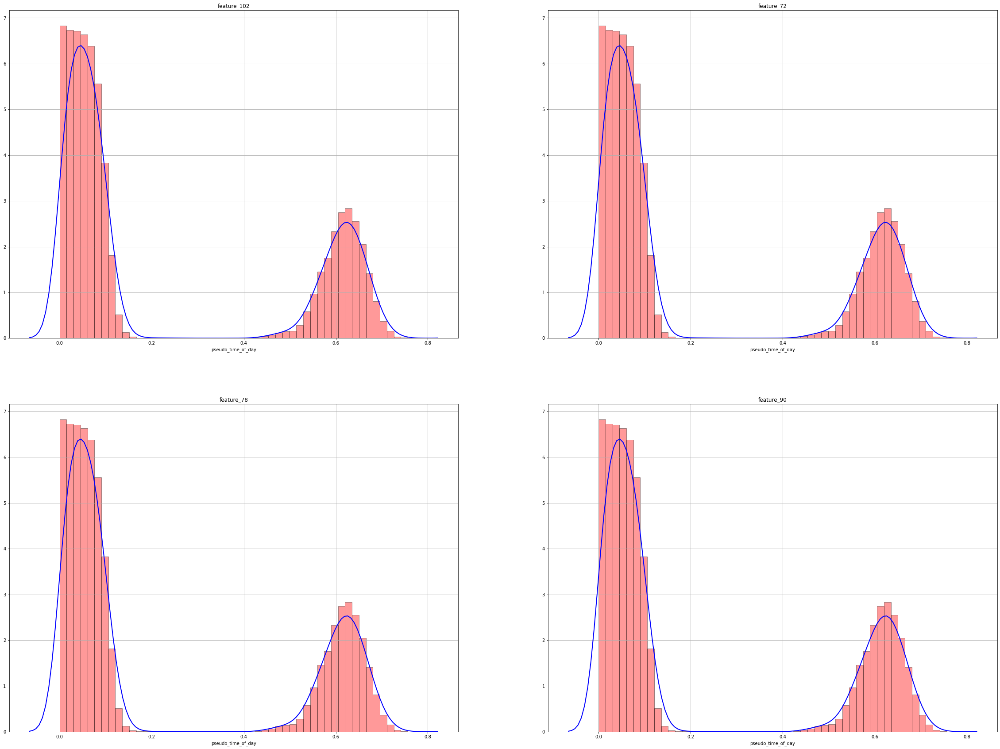

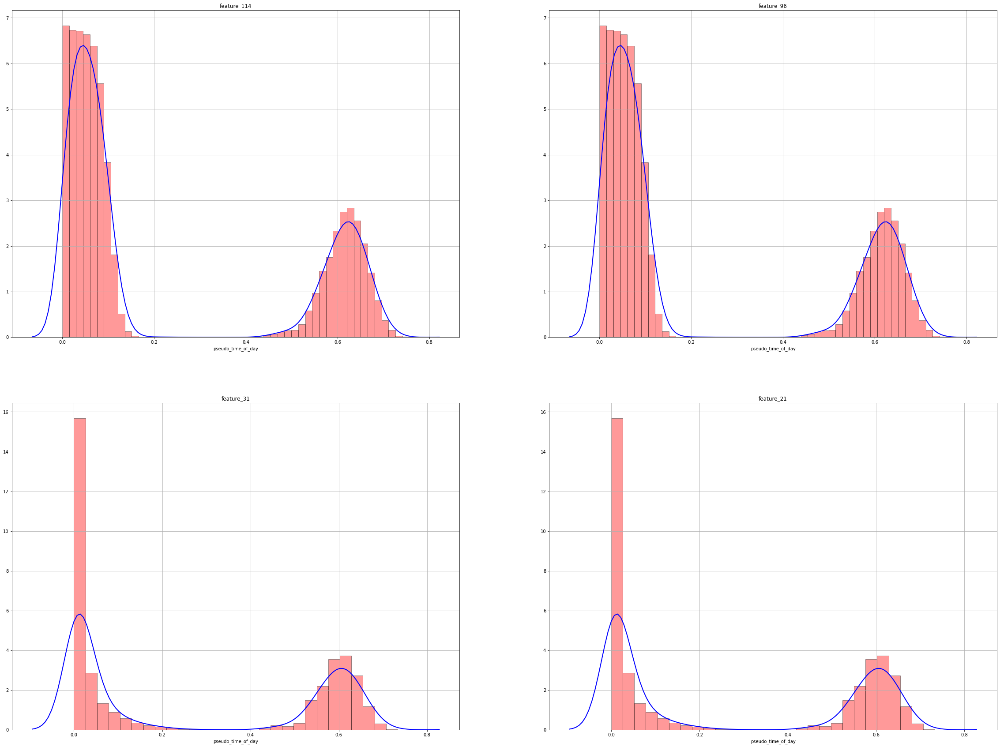

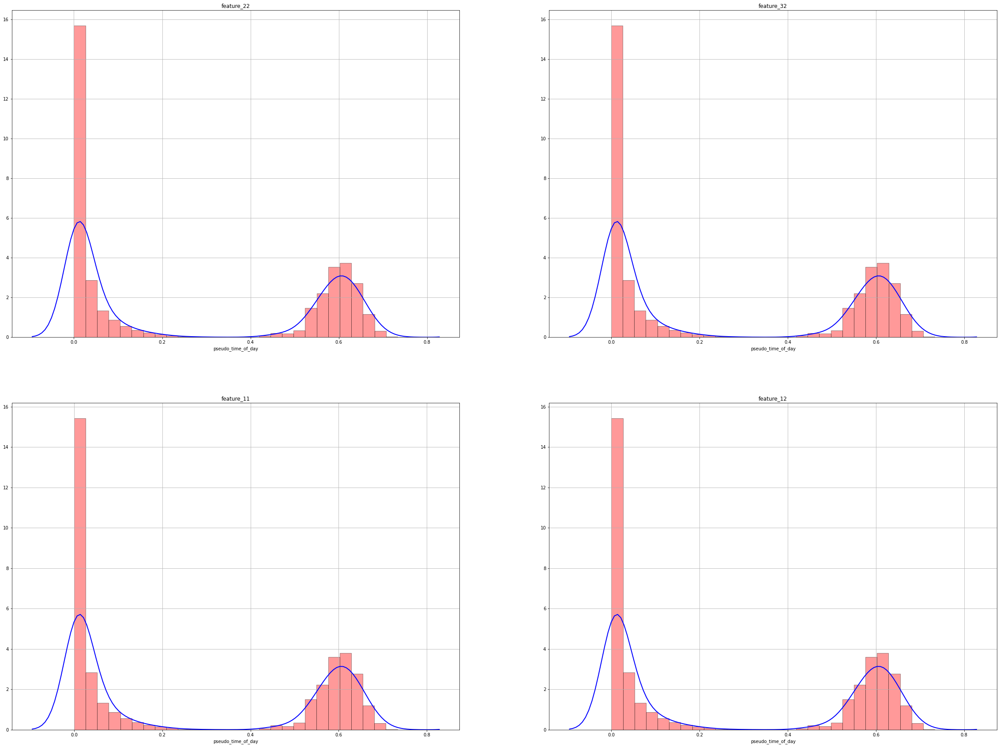

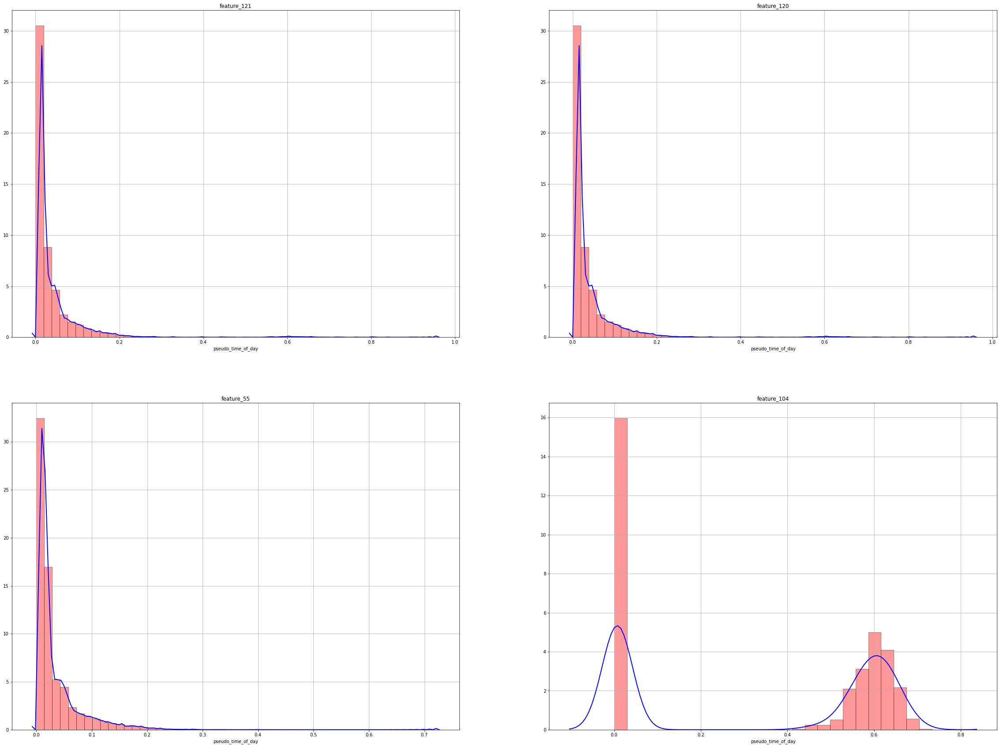

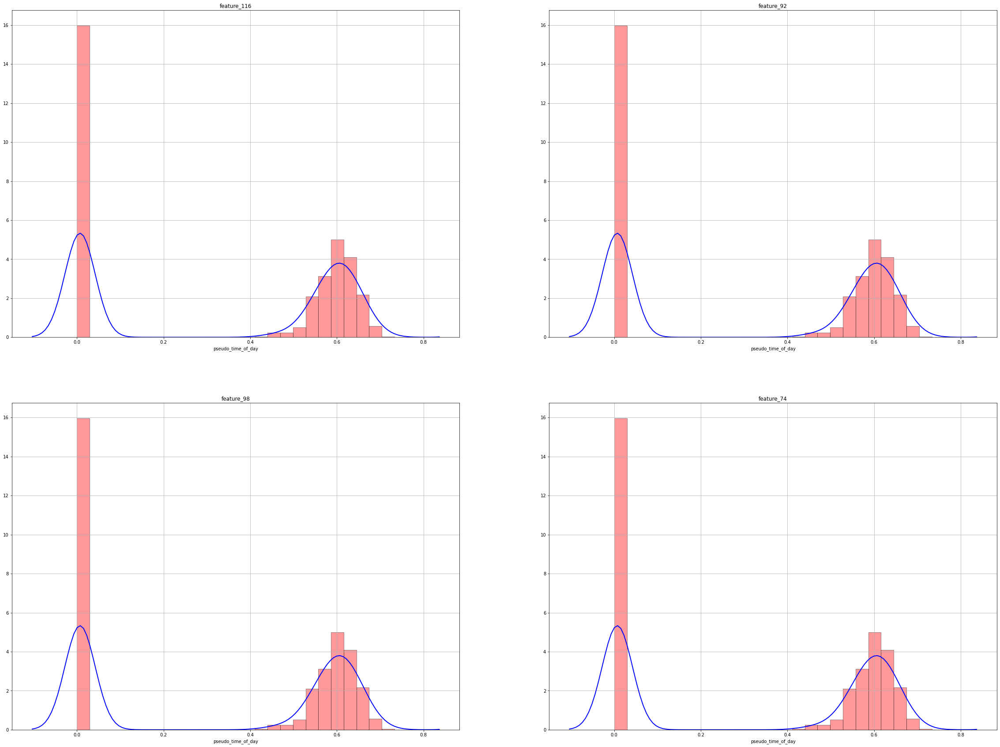

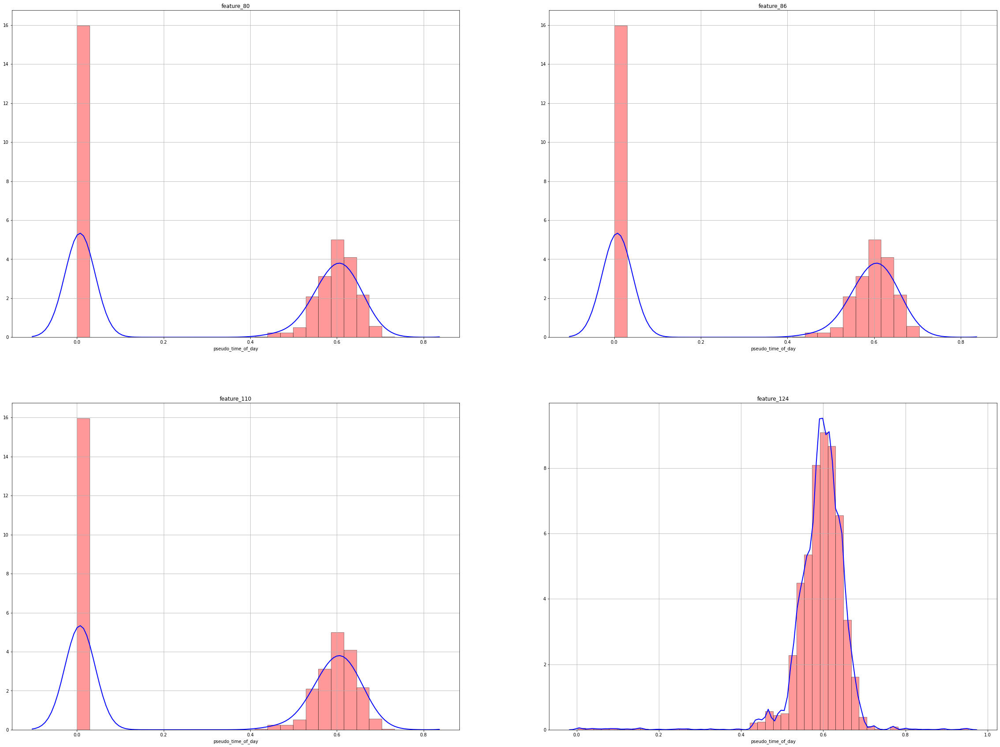

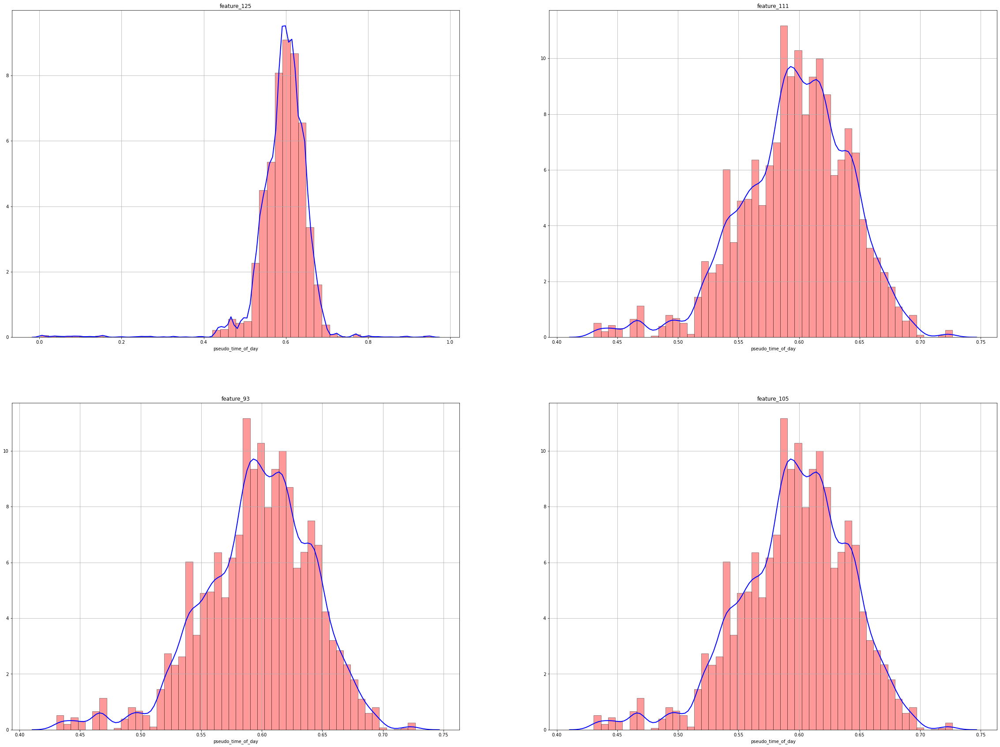

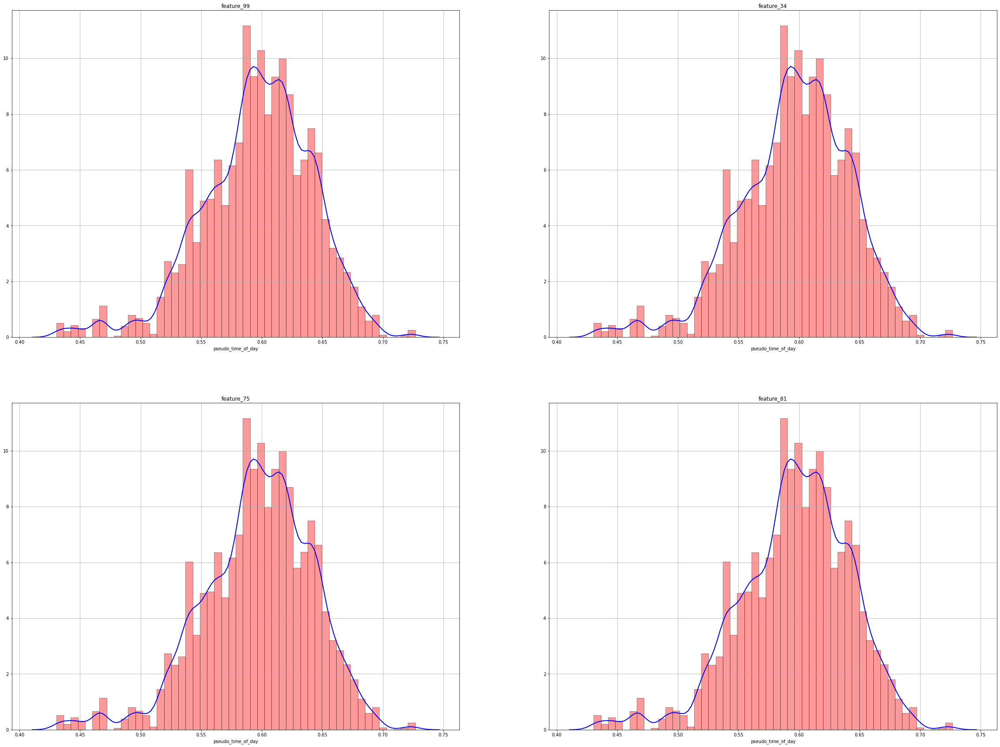

In [119]:
features_chunks = chunks(top_nan_features, 10)
chunk_len = 4

for k_chunk in features_chunks:
    fig, axes = plt.subplots(2, 2, figsize = (40, 30))
    ax = axes.ravel()
    
    for i in range(len(k_chunk)):

        feature_name = k_chunk[i]
        feature = nan_df.loc[nan_df[feature_name] == 1]['pseudo_time_of_day']
        
        sns.distplot(feature, hist=True, kde=True, color = 'red', hist_kws={'edgecolor':'black'},
                     kde_kws={'linewidth': 2, 'color': 'blue'}, ax = ax[i%10])
        ax[i%10].grid(True)
        ax[i%10].set(xlabel = 'pseudo_time_of_day')
        ax[i%10].set_title(feature_name)

Text(0.5, 0.89, 'Overall Distribution per features_0-29 [dist, box, scatter, cumsum]')

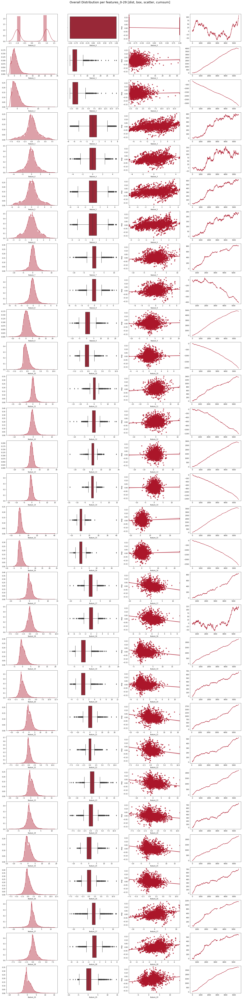

In [157]:
df_day_0 = df_train.loc[df_train.date==0]

features_list = [features[i*30:(i+1)*30]for i in range(5)]
resp_features = [["resp"]+ features for features in features_list]

df_resp_features_0 = df_day_0.loc[:, resp_features[0]]

fig, axes = plt.subplots(30,4,figsize=[28,120])

for idx, col in enumerate(tqdm_notebook(resp_features[0][1:])):
    targets = ["resp"] + [col]

    df_target = df_resp_features_0.loc[:,targets]
    # 1. distplot
    sns.distplot(df_target[col], ax=axes[idx,0])
    # 2. boxplot
    sns.boxplot(df_target[col], ax=axes[idx,1])
    # 3. scatterplot with resp
    sns.regplot(data=df_target, x=col, y="resp", ax=axes[idx,2])
    # 4. cumulative data
    df_target[col].cumsum().plot(ax=axes[idx,3])

plt.suptitle("Overall Distribution per features_0-29 [dist, box, scatter, cumsum]",y=0.89, size=20)

Text(0.5, 0.89, 'Overall Distribution per features_30-59 [dist, box, scatter, cumsum]')

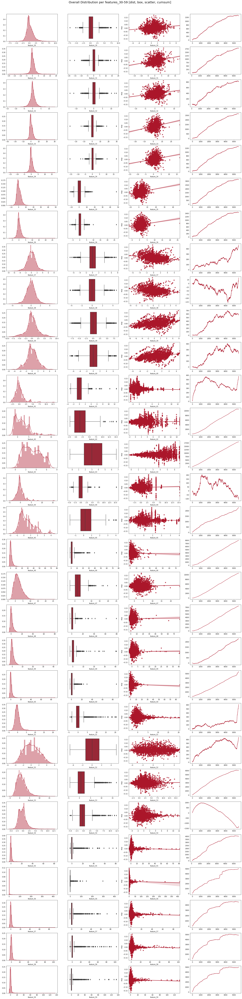

In [158]:
df_resp_features_1 = df_day_0.loc[:, resp_features[1]]

fig, axes = plt.subplots(30,4,figsize=[28,120])

for idx, col in enumerate(tqdm_notebook(resp_features[1][1:])):
    targets = ["resp"] + [col]

    df_target = df_resp_features_1.loc[:,targets]
    # 1. distplot
    sns.distplot(df_target[col], ax=axes[idx,0])
    # 2. boxplot
    sns.boxplot(df_target[col], ax=axes[idx,1])
    # 3. scatterplot with resp
    sns.regplot(data=df_target, x=col, y="resp", ax=axes[idx,2])
    # 4. cumulative data
    df_target[col].cumsum().plot(ax=axes[idx,3])

plt.suptitle("Overall Distribution per features_30-59 [dist, box, scatter, cumsum]",y=0.89, size=20)

Text(0.5, 0.89, 'Overall Distribution per features_60-89 [dist, box, scatter, cumsum]')

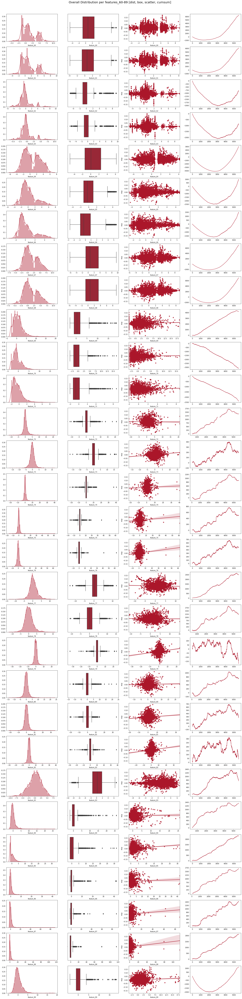

In [159]:
df_resp_features_2 = df_day_0.loc[:, resp_features[2]]

fig, axes = plt.subplots(30,4,figsize=[28,120])

for idx, col in enumerate(tqdm_notebook(resp_features[2][1:])):
    targets = ["resp"] + [col]

    df_target = df_resp_features_2.loc[:,targets]
    # 1. distplot
    sns.distplot(df_target[col], ax=axes[idx,0])
    # 2. boxplot
    sns.boxplot(df_target[col], ax=axes[idx,1])
    # 3. scatterplot with resp
    sns.regplot(data=df_target, x=col, y="resp", ax=axes[idx,2])
    # 4. cumulative data
    df_target[col].cumsum().plot(ax=axes[idx,3])

plt.suptitle("Overall Distribution per features_60-89 [dist, box, scatter, cumsum]",y=0.89, size=20)

Text(0.5, 0.89, 'Overall Distribution per features_90-119 [dist, box, scatter, cumsum]')

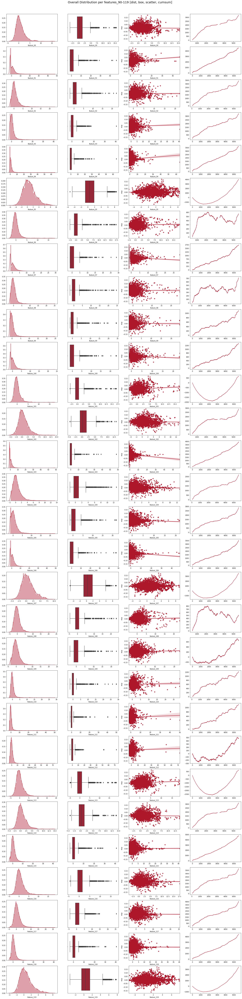

In [160]:
df_resp_features_3 = df_day_0.loc[:, resp_features[3]]

fig, axes = plt.subplots(30,4,figsize=[28,120])

for idx, col in enumerate(tqdm_notebook(resp_features[3][1:])):
    targets = ["resp"] + [col]

    df_target = df_resp_features_3.loc[:,targets]
    # 1. distplot
    sns.distplot(df_target[col], ax=axes[idx,0])
    # 2. boxplot
    sns.boxplot(df_target[col], ax=axes[idx,1])
    # 3. scatterplot with resp
    sns.regplot(data=df_target, x=col, y="resp", ax=axes[idx,2])
    # 4. cumulative data
    df_target[col].cumsum().plot(ax=axes[idx,3])

plt.suptitle("Overall Distribution per features_90-119 [dist, box, scatter, cumsum]",y=0.89, size=20)

Text(0.5, 0.89, 'Overall Distribution per features_120-129 [dist, box, scatter, cumsum]')

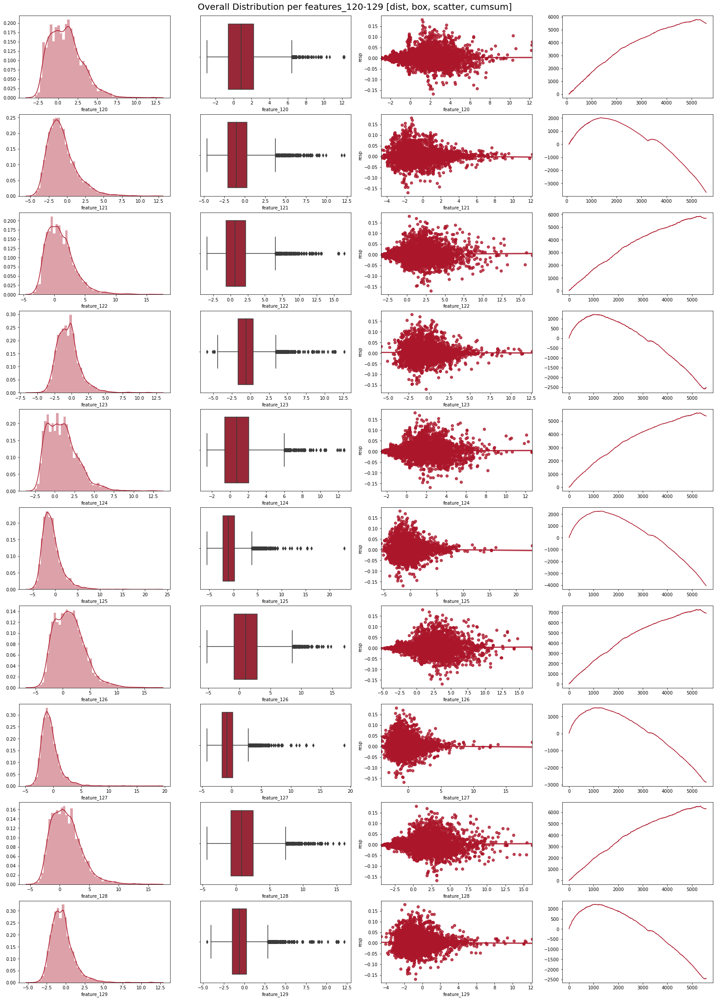

In [161]:
df_resp_features_4 = df_day_0.loc[:, resp_features[4]]

fig, axes = plt.subplots(10,4,figsize=[28,40])

for idx, col in enumerate(tqdm_notebook(resp_features[4][1:])):
    targets = ["resp"] + [col]

    df_target = df_resp_features_4.loc[:,targets]
    # 1. distplot
    sns.distplot(df_target[col], ax=axes[idx,0])
    # 2. boxplot
    sns.boxplot(df_target[col], ax=axes[idx,1])
    # 3. scatterplot with resp
    sns.regplot(data=df_target, x=col, y="resp", ax=axes[idx,2])
    # 4. cumulative data
    df_target[col].cumsum().plot(ax=axes[idx,3])

plt.suptitle("Overall Distribution per features_120-129 [dist, box, scatter, cumsum]",y=0.89, size=20)

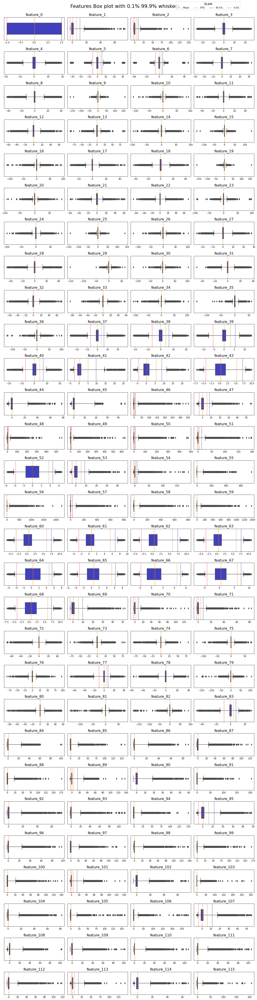

In [129]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(20,80))
fig.suptitle('Features Box plot with 0.1% 99.9% whiskers',fontsize=22, y=.89)
grid =  gridspec.GridSpec(29,4,figure=fig,hspace=.5,wspace=.05)
featstr = [i for i in df_train.columns[7:-1]]
counter = 0
for i in range(29):
    for j in range(4):
        subf = fig.add_subplot(grid[i, j]);
        sns.boxplot(x= df_train[featstr[counter]],saturation=.5,color= 'blue', ax= subf,width=.5,whis=(.1,99.9));
        subf.axvline(df_train[featstr[counter]].mean(),color= 'darkorange', label='Mean', linestyle=':',linewidth=3)
        subf.axvline(np.percentile(df_train[featstr[counter]],97),color= 'chocolate', label='97%', linestyle=':',linewidth=2)
        subf.axvline(np.percentile(df_train[featstr[counter]],99.5),color= 'darkblue', label='99.5%', linestyle=':',linewidth=2)
        subf.axvline(np.percentile(df_train[featstr[counter]],.5),color= 'red', label='0.5%', linestyle=':',linewidth=2)
        subf.legend().set_visible(False)
        subf.set_xlabel('')
        subf.set_title('{}'.format(featstr[counter]),fontsize=16)
        counter += 1
        gc.collect()

handles, labels = subf.get_legend_handles_labels()
fig.legend(handles, labels,ncol=4, bbox_to_anchor=(0.90, 0.893),fontsize=10,
           title= 'Scale',title_fontsize=14,bbox_transform =fig.transFigure);
plt.show();

In [134]:
n999 = [ np.percentile(df_train[i],99.9) for i in featstr[1:]]
n001 = [ np.percentile(df_train[i],.1) for i in featstr[1:]]

In [137]:
df = df_train.copy()

for i, j in enumerate(featstr[1:]):
    df = df[df[j] < n999[i]]
    gc.collect()

In [138]:
str(round(((len(df_train) - len(df))/len(df_train))*100,2))+'%'

'100.0%'

In [149]:
np.percentile(df_train["feature_3"],q=99.9)

nan

In [155]:
df_train["feature_2"].isnull().sum()

0

In [152]:
n999

[16.706665954590697,
 16.217727088929088,
 nan,
 nan,
 7.121641879081841,
 7.671872882843116,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 9.579496116638223,
 9.406639080048137,
 7.542234363556011,
 9.450449705124186,
 14.300119400024414,
 11.49887752532959,
 8.036633491516113,
 nan,
 nan,
 27.475600471497167,
 11.314781141281207,
 28.867975597382504,
 39.41010768890905,
 39.251449890138296,
 26.72169216156045,
 5.166971683502197,
 12.710333824157715,
 13.282188138961914,
 nan,
 nan,
 85.36641662598117,
 nan,
 nan,
 8.184848365783727,
 7.446440224647551,
 8.137345380783117,
 8.402484893798828,
 6.005152316093476,
 6.77378182888034,
 5.37824768543245,
 8.028890008926435,
 7.839646801948588,
 14.973638324738214,
 14.704103116989579,
 12.865207452774586,
 nan,
 nan,
 nan,
 nan,
 nan,
 12.91474912643444,
 nan,
 nan,
 nan,
 nan,
 nan,
 11.454964056015312,
 

#### 2. Clustering

partial vs hierarchical

* partitial: produce a flat partition, where an element belongs to one and only one cluster

* hierarchical: create a multi-layered partition, with clusters of elements at the bottom level, clusters of clusters at the next level, and so on, until a single all-inclusive cluster at the top of that hierarchy.

    \- aglomerative(to inclusive side), divisive(to individual side): difference btw direction to make cluster)
    
Types of cluster models   
 
* Connectivity models: (e.g.: hierarchical clustering) are based on a notion of distance connectivity.

* Centroid models: (e.g.: k-means algorithm) represents each cluster by a single mean vector.

* Distribution models: (e.g.: EM algorithms) clusters are modeled using statistical distributions.

* Density models: (e.g.: DBSCAN, OPTICS) defines clusters as connected dense regions in the data space.

* Graph-based models: (e.g.: HCS clustering algorithm) work by representing the similarity in data through a similarity graph and then finding all the highly connected subgraphs.

Among hierarchical methods, there are two representative choice, 'correlation distance based' and 'Information-based'

In [10]:
df_train.head()

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,...,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
0,0,0.000000,0.009916,0.014079,0.008773,0.001390,0.006270,1,-1.872746,-2.191242,...,NaN,1.168391,8.313582,1.782433,14.018213,2.653056,12.600291,2.301488,11.445807,0
1,0,16.673515,-0.002828,-0.003226,-0.007319,-0.011114,-0.009792,-1,-1.349537,-1.704709,...,NaN,-1.178850,1.777472,-0.915459,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,0,0.000000,0.025134,0.027607,0.033406,0.034380,0.023970,-1,0.812780,-0.256156,...,NaN,6.115747,9.667908,5.542871,11.671595,7.281757,10.060014,6.638248,9.427299,2
3,0,0.000000,-0.004730,-0.003273,-0.000461,-0.000476,-0.003200,-1,1.174379,0.344640,...,NaN,2.838853,0.499251,3.033731,1.513488,4.397532,1.266037,3.856384,1.013469,3
4,0,0.138531,0.001252,0.002165,-0.001215,-0.006219,-0.002604,1,-3.172026,-3.093182,...,NaN,0.344850,4.101145,0.614252,6.623456,0.800129,5.233243,0.362636,3.926633,4


In [11]:
df_features.head()

,feature,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8,...,tag_19,tag_20,tag_21,tag_22,tag_23,tag_24,tag_25,tag_26,tag_27,tag_28
0,feature_0,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,feature_1,False,False,False,False,False,False,True,True,False,...,False,False,False,False,False,False,False,False,False,False
2,feature_2,False,False,False,False,False,False,True,True,False,...,False,False,False,False,False,False,False,False,False,False
3,feature_3,False,False,False,False,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,False
4,feature_4,False,False,False,False,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,False


In [12]:
n_days = 31

days = list(range(n_days))
df_red = df_train[df_train.date.isin(days)]
df_red.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 197635 entries, 0 to 197634
Columns: 138 entries, date to ts_id
dtypes: float32(129), float64(6), int16(1), int32(1), int8(1)
memory usage: 109.1 MB


In [13]:
df_red.head()

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,...,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
0,0,0.000000,0.009916,0.014079,0.008773,0.001390,0.006270,1,-1.872746,-2.191242,...,NaN,1.168391,8.313582,1.782433,14.018213,2.653056,12.600291,2.301488,11.445807,0
1,0,16.673515,-0.002828,-0.003226,-0.007319,-0.011114,-0.009792,-1,-1.349537,-1.704709,...,NaN,-1.178850,1.777472,-0.915459,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,0,0.000000,0.025134,0.027607,0.033406,0.034380,0.023970,-1,0.812780,-0.256156,...,NaN,6.115747,9.667908,5.542871,11.671595,7.281757,10.060014,6.638248,9.427299,2
3,0,0.000000,-0.004730,-0.003273,-0.000461,-0.000476,-0.003200,-1,1.174379,0.344640,...,NaN,2.838853,0.499251,3.033731,1.513488,4.397532,1.266037,3.856384,1.013469,3
4,0,0.138531,0.001252,0.002165,-0.001215,-0.006219,-0.002604,1,-3.172026,-3.093182,...,NaN,0.344850,4.101145,0.614252,6.623456,0.800129,5.233243,0.362636,3.926633,4


In [14]:
ft = df_red.iloc[:,8:-1]
ft['resp'] = df_red.resp
ft['wresp'] = df_red.resp*df_train.weight

ft = (ft - ft.mean())/(ft.std())
ft.rename(columns=lambda s: s.replace('feature_','ft_'),inplace=True)
ft.head()

,ft_1,ft_2,ft_3,ft_4,ft_5,ft_6,ft_7,ft_8,ft_9,ft_10,...,ft_122,ft_123,ft_124,ft_125,ft_126,ft_127,ft_128,ft_129,resp,wresp
0,-0.899584,-0.931728,-0.231226,-0.216155,-0.007483,-0.008643,NaN,NaN,-0.583005,-0.624471,...,0.181562,4.203762,0.553481,5.969428,0.661369,6.827621,0.604545,6.450321,0.172374,-0.004678
1,-0.708243,-0.712912,0.012365,0.009550,0.082103,0.083949,NaN,NaN,-0.264327,-0.186930,...,-0.866329,0.816488,-0.829208,1.163279,-0.852280,1.180698,-0.867077,0.988329,-0.352212,-1.368905
2,0.082531,-0.061433,0.344093,0.248298,-0.322039,-0.240505,NaN,NaN,1.865047,1.806397,...,2.390236,4.905627,2.480733,4.961240,2.382774,5.435309,2.374343,5.295515,0.750447,-0.004678
3,0.214770,0.208772,0.011833,-0.002699,-0.518205,-0.452189,NaN,NaN,1.507605,1.686413,...,0.927315,0.154062,1.194780,0.596967,1.310137,0.615381,1.239086,0.481890,-0.136931,-0.004678
4,-1.374740,-1.337371,-0.090771,-0.091000,-0.112370,-0.101631,NaN,NaN,0.813602,1.011779,...,-0.186096,2.020708,-0.045220,2.792386,-0.027730,2.789784,-0.186686,2.148536,-0.117449,-0.007692


In [11]:
# Outliers threshold: 0.999 quantile
outl_thresh = 0.999

outliers_mask = (ft.abs() > ft.abs().quantile(outl_thresh)).any(axis=1)
total_rows    = outliers_mask.size
dropped_rows  = outliers_mask.sum()
print('Dropped rows = ', outliers_mask.sum(), '({:.2%} of the total number of rows)'.format(dropped_rows/total_rows,2))
ft = ft[~outliers_mask]

Dropped rows =  8067 (4.08% of the total number of rows)


Let us analyze the correlation-based metric. Consider the  N×F  feature matrix, where in our case  F=131(w/ resp or wresp)  and  N  is the number of observations. We would like to combine these  F  column vectors into a hierarchical structure of clusters. The steps are as follows:

compute the  F×F  correlation matrix  ρ={ρi,j}i,j=1,...,N 
derive a distance matrix  D=di,j=12(1−ρi,j)−−−−−−−−−√ 
compute the linkage matrix  L  from the distance matrix  D 
rearrange the rows and columns of the correlation matrix so that the largest values lie along the diagonal (Quasi-Diagonalization).
To visualize the distance between features, we will use two very helpful tools: Dendrograms and Minimum Spanning Trees.

It can be shown [2] that  di,j  is a distance in the mathematical sense. If two features are perfectly anticorrelated (ρ=-1), the distance between them is d=1, while if they are perfectly correlated (ρ=1), the distance is d=0.

The distance as a function of the Pearson correlation coefficient is plotted below.

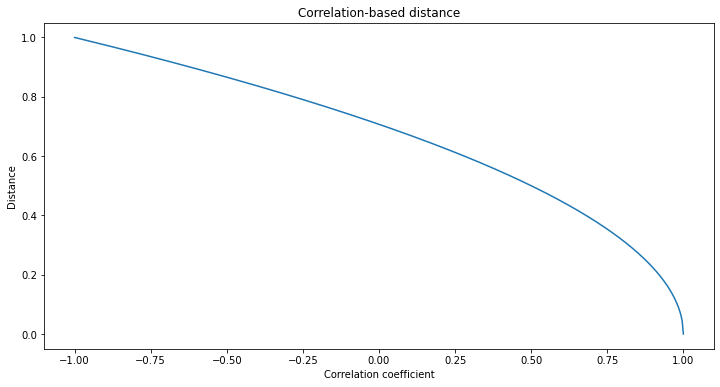

In [12]:
r = np.linspace(-1,1,500)
d = np.sqrt(0.5*(1-r))

plt.figure(figsize=(12,6))
plt.title('Correlation-based distance')
plt.xlabel('Correlation coefficient')
plt.ylabel('Distance')
plt.plot(r,d)
plt.show()

### Feature Selection

1. Deleting before changing 'Trading Strategy'
2. Missing Value Distribution

In [13]:
# 1. Paerson correlation coefficient
corr_mat = ft.corr(method='pearson')

# 2. Correlation-based distance
dist = np.sqrt(0.5*(1-corr_mat))

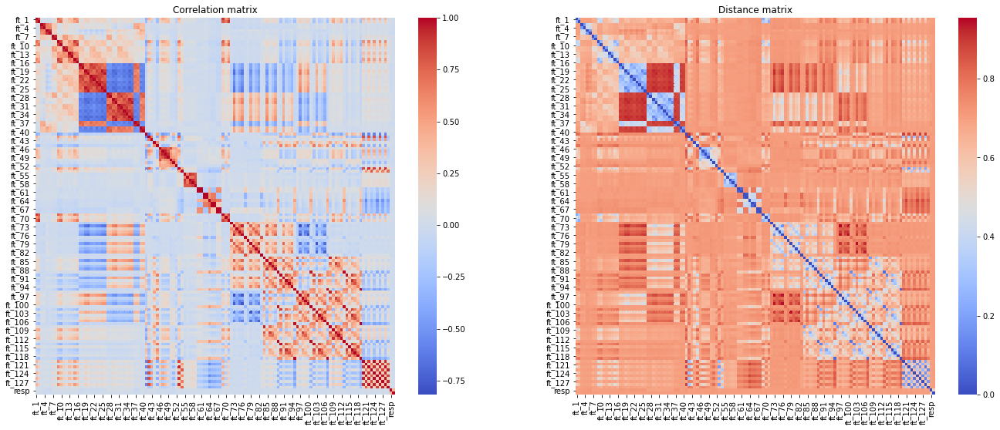

In [14]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(23,9))

sns.heatmap(corr_mat,ax= ax1, cmap='coolwarm');
sns.heatmap(dist,    ax= ax2, cmap='coolwarm');
ax1.title.set_text('Correlation matrix')
ax2.title.set_text('Distance matrix')
plt.show()

In [15]:
import networkx as nx

# Complete graph from distance matrix
G = nx.from_numpy_matrix(dist.to_numpy())

labels = dist.columns.values
labels = [s.replace('ft_','') for s in labels]
G = nx.relabel_nodes(G, dict(zip(range(len(labels)), labels)))

In [16]:
dict(zip(range(len(labels)), labels))

{0: '1',
 1: '2',
 2: '3',
 3: '4',
 4: '5',
 5: '6',
 6: '7',
 7: '8',
 8: '9',
 9: '10',
 10: '11',
 11: '12',
 12: '13',
 13: '14',
 14: '15',
 15: '16',
 16: '17',
 17: '18',
 18: '19',
 19: '20',
 20: '21',
 21: '22',
 22: '23',
 23: '24',
 24: '25',
 25: '26',
 26: '27',
 27: '28',
 28: '29',
 29: '30',
 30: '31',
 31: '32',
 32: '33',
 33: '34',
 34: '35',
 35: '36',
 36: '37',
 37: '38',
 38: '39',
 39: '40',
 40: '41',
 41: '42',
 42: '43',
 43: '44',
 44: '45',
 45: '46',
 46: '47',
 47: '48',
 48: '49',
 49: '50',
 50: '51',
 51: '52',
 52: '53',
 53: '54',
 54: '55',
 55: '56',
 56: '57',
 57: '58',
 58: '59',
 59: '60',
 60: '61',
 61: '62',
 62: '63',
 63: '64',
 64: '65',
 65: '66',
 66: '67',
 67: '68',
 68: '69',
 69: '70',
 70: '71',
 71: '72',
 72: '73',
 73: '74',
 74: '75',
 75: '76',
 76: '77',
 77: '78',
 78: '79',
 79: '80',
 80: '81',
 81: '82',
 82: '83',
 83: '84',
 84: '85',
 85: '86',
 86: '87',
 87: '88',
 88: '89',
 89: '90',
 90: '91',
 91: '92',
 92: '9

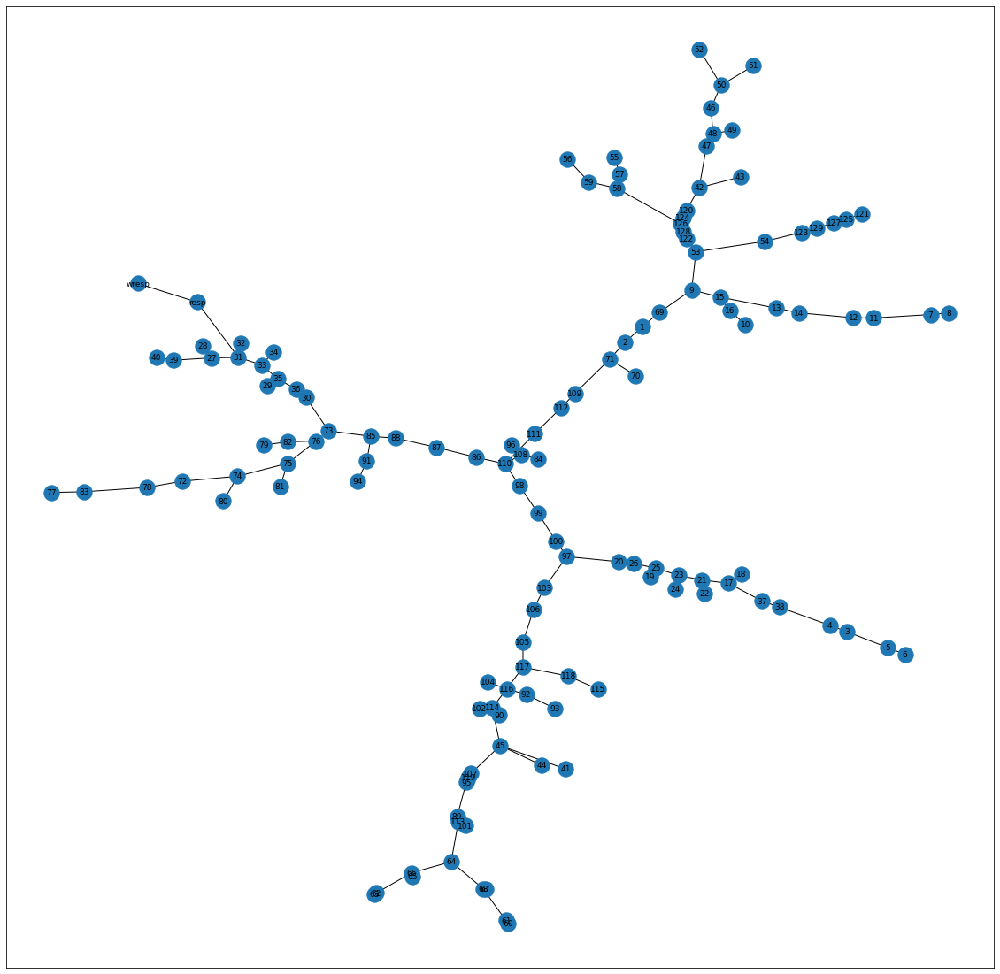

In [17]:
# Minimum spanning tree
T=nx.minimum_spanning_tree(G)

fig = plt.figure(figsize=(20,20))
nx.draw_networkx(T,
                 with_labels=True, 
                 font_size=9, 
                 cmap=plt.cm.coolwarm,
                 pos=nx.kamada_kawai_layout(T),vmin=0, vmax=1)
plt.show()

In [18]:
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import fcluster

# Linkage matrix
link=sch.linkage(dist,'average')

In [21]:
dist.shape

(131, 131)

In [20]:
link.shape

(130, 4)

In [30]:
link

array([[6.60000000e+01, 6.70000000e+01, 3.38859147e-02, 2.00000000e+00],
       [6.10000000e+01, 6.20000000e+01, 4.21031170e-02, 2.00000000e+00],
       [5.90000000e+01, 6.00000000e+01, 7.25777901e-02, 2.00000000e+00],
       [6.40000000e+01, 6.50000000e+01, 7.44066301e-02, 2.00000000e+00],
       [1.06000000e+02, 1.18000000e+02, 1.17178802e-01, 2.00000000e+00],
       [8.80000000e+01, 1.12000000e+02, 1.44063441e-01, 2.00000000e+00],
       [1.21000000e+02, 1.27000000e+02, 1.55832306e-01, 2.00000000e+00],
       [1.23000000e+02, 1.25000000e+02, 1.62542113e-01, 2.00000000e+00],
       [9.40000000e+01, 1.35000000e+02, 1.65229334e-01, 3.00000000e+00],
       [1.00000000e+02, 1.36000000e+02, 2.13417044e-01, 3.00000000e+00],
       [1.19000000e+02, 1.38000000e+02, 2.18109321e-01, 3.00000000e+00],
       [1.80000000e+01, 2.40000000e+01, 2.23309803e-01, 2.00000000e+00],
       [1.90000000e+01, 2.50000000e+01, 2.27577480e-01, 2.00000000e+00],
       [2.90000000e+01, 3.50000000e+01, 2.33277080e

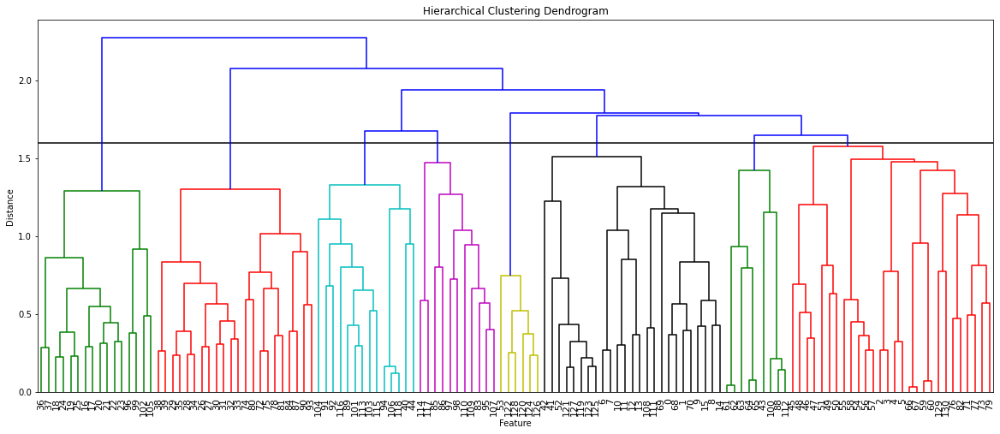

In [22]:
# Plot dendrogram

fig = plt.figure(figsize=(20, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Feature')
plt.ylabel('Distance')
plt.hlines(1.6,0,1320)
dn = sch.dendrogram(link,leaf_rotation=90.,leaf_font_size=11.)
plt.show()

In [23]:
# fcluster forms flat clusters from the hierarchical clustering defined by the given linkage matrix.

max_d = 1.6
clusters = fcluster(link,t=max_d, criterion='distance')

In [25]:
clusters.shape

(131,)

In [26]:
df_clust = pd.DataFrame({'Cluster':clusters, 'Features':ft.columns.values.astype('str')})
df_clust.groupby('Cluster').count()

,Features
Cluster,
1,16
2,22
3,14
4,11
5,6
6,25
7,9
8,28


In [27]:
df_clust

,Cluster,Features
0,6,ft_1
1,6,ft_2
2,8,ft_3
3,8,ft_4
4,8,ft_5
...,...,...
126,5,ft_127
127,6,ft_128
128,5,ft_129
129,8,resp


In [28]:
# Save the cluster-feature in a dictionary 
clust_feat = {}
for k in np.unique(clusters):
    clust_feat[k] = df_clust[df_clust.Cluster == k].Features.values

In [29]:
clust_feat

{1: array(['ft_17', 'ft_18', 'ft_19', 'ft_20', 'ft_21', 'ft_22', 'ft_23',
        'ft_24', 'ft_25', 'ft_26', 'ft_37', 'ft_38', 'ft_97', 'ft_100',
        'ft_103', 'ft_106'], dtype=object),
 2: array(['ft_27', 'ft_28', 'ft_29', 'ft_30', 'ft_31', 'ft_32', 'ft_33',
        'ft_34', 'ft_35', 'ft_36', 'ft_39', 'ft_40', 'ft_73', 'ft_75',
        'ft_76', 'ft_79', 'ft_81', 'ft_82', 'ft_85', 'ft_88', 'ft_91',
        'ft_94'], dtype=object),
 3: array(['ft_41', 'ft_45', 'ft_90', 'ft_92', 'ft_93', 'ft_95', 'ft_102',
        'ft_104', 'ft_105', 'ft_107', 'ft_114', 'ft_116', 'ft_117',
        'ft_119'], dtype=object),
 4: array(['ft_84', 'ft_86', 'ft_87', 'ft_96', 'ft_98', 'ft_99', 'ft_108',
        'ft_110', 'ft_111', 'ft_115', 'ft_118'], dtype=object),
 5: array(['ft_54', 'ft_121', 'ft_123', 'ft_125', 'ft_127', 'ft_129'],
       dtype=object),
 6: array(['ft_1', 'ft_2', 'ft_7', 'ft_8', 'ft_9', 'ft_10', 'ft_11', 'ft_12',
        'ft_13', 'ft_14', 'ft_15', 'ft_16', 'ft_42', 'ft_43', 'ft_53',
   

In [33]:
link

array([[6.60000000e+01, 6.70000000e+01, 3.38859147e-02, 2.00000000e+00],
       [6.10000000e+01, 6.20000000e+01, 4.21031170e-02, 2.00000000e+00],
       [5.90000000e+01, 6.00000000e+01, 7.25777901e-02, 2.00000000e+00],
       [6.40000000e+01, 6.50000000e+01, 7.44066301e-02, 2.00000000e+00],
       [1.06000000e+02, 1.18000000e+02, 1.17178802e-01, 2.00000000e+00],
       [8.80000000e+01, 1.12000000e+02, 1.44063441e-01, 2.00000000e+00],
       [1.21000000e+02, 1.27000000e+02, 1.55832306e-01, 2.00000000e+00],
       [1.23000000e+02, 1.25000000e+02, 1.62542113e-01, 2.00000000e+00],
       [9.40000000e+01, 1.35000000e+02, 1.65229334e-01, 3.00000000e+00],
       [1.00000000e+02, 1.36000000e+02, 2.13417044e-01, 3.00000000e+00],
       [1.19000000e+02, 1.38000000e+02, 2.18109321e-01, 3.00000000e+00],
       [1.80000000e+01, 2.40000000e+01, 2.23309803e-01, 2.00000000e+00],
       [1.90000000e+01, 2.50000000e+01, 2.27577480e-01, 2.00000000e+00],
       [2.90000000e+01, 3.50000000e+01, 2.33277080e

In [31]:
def getQuasiDiag(link):
    # Sort clustered items by distance
    link=link.astype(int)
    sortIx=pd.Series([link[-1,0],link[-1,1]])
    numItems=link[-1,3] # number of original items
    while sortIx.max()>=numItems:
        sortIx.index=range(0,sortIx.shape[0]*2,2) # make space
        df0=sortIx[sortIx>=numItems] # find clusters
        i=df0.index;j=df0.values-numItems
        sortIx[i]=link[j,0] # item 1
        df0=pd.Series(link[j,1],index=i+1)
        sortIx=sortIx.append(df0) # item 2
        sortIx=sortIx.sort_index() # re-sort
        sortIx.index=range(sortIx.shape[0]) # re-index
    return sortIx.tolist()

In [39]:
sortIx=pd.Series([link[-1,0],link[-1,1]])
sortIx

0    243.0
1    259.0
dtype: float64

In [32]:
sortIx=getQuasiDiag(link)
sortIx=corr_mat.index[sortIx].tolist() # recover labels
corr_diag=corr_mat.loc[sortIx,sortIx] # reorder

sortIx=getQuasiDiag(link)
sortIx=dist.index[sortIx].tolist() # recover labels
dist_diag=dist.loc[sortIx,sortIx] # reorder

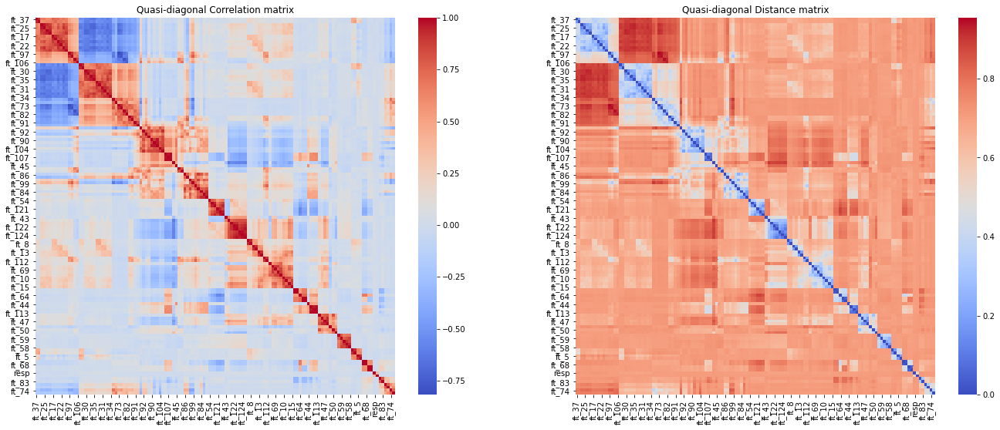

In [40]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(23,9))

sns.heatmap(corr_diag,ax= ax1, cmap='coolwarm');
sns.heatmap(dist_diag,ax= ax2, cmap='coolwarm');
ax1.title.set_text('Quasi-diagonal Correlation matrix')
ax2.title.set_text('Quasi-diagonal Distance matrix')
plt.show()

In [41]:
corr_diag

,ft_37,ft_38,ft_19,ft_25,ft_20,ft_26,ft_17,ft_18,ft_21,ft_22,...,ft_60,ft_61,resp,wresp,ft_77,ft_83,ft_72,ft_78,ft_74,ft_80
ft_37,1.000000,0.936828,0.661861,0.683008,0.608233,0.619613,0.769958,0.724932,0.727611,0.652314,...,0.009016,0.009351,-0.034591,-0.006886,-0.011724,-0.007914,-0.127824,-0.108723,-0.216585,-0.171193
ft_38,0.936828,1.000000,0.595053,0.614850,0.637788,0.647514,0.700395,0.750416,0.662473,0.673542,...,0.004945,0.005078,-0.034368,-0.011523,-0.023239,-0.016208,-0.137050,-0.114247,-0.224995,-0.172515
ft_19,0.661861,0.595053,1.000000,0.965639,0.918510,0.886134,0.718945,0.659006,0.793999,0.705555,...,-0.009579,-0.008922,-0.008555,0.004614,-0.045051,-0.016560,-0.179275,-0.124851,-0.302602,-0.200733
ft_25,0.683008,0.614850,0.965639,1.000000,0.889410,0.924336,0.753828,0.693617,0.837517,0.750749,...,-0.006491,-0.005684,-0.014999,0.002114,-0.041315,-0.017469,-0.170698,-0.121354,-0.288400,-0.194035
ft_20,0.608233,0.637788,0.918510,0.889410,1.000000,0.962279,0.650710,0.695230,0.728486,0.750842,...,-0.022567,-0.022360,-0.010664,0.003009,-0.051756,-0.020024,-0.195660,-0.129356,-0.323656,-0.200226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ft_83,-0.007914,-0.016208,-0.016560,-0.017469,-0.020024,-0.020320,-0.010910,-0.013049,-0.010873,-0.010984,...,0.233043,0.234592,-0.016533,-0.005822,0.809293,1.000000,0.287339,0.391753,0.154688,0.222848
ft_72,-0.127824,-0.137050,-0.179275,-0.170698,-0.195660,-0.183677,-0.119555,-0.125805,-0.132512,-0.134594,...,0.093035,0.089823,-0.003984,-0.001294,0.363705,0.287339,1.000000,0.792756,0.604880,0.479071
ft_78,-0.108723,-0.114247,-0.124851,-0.121354,-0.129356,-0.123828,-0.097193,-0.100118,-0.102423,-0.101502,...,0.087291,0.085770,-0.002959,0.000768,0.317758,0.391753,0.792756,1.000000,0.451986,0.590566
ft_74,-0.216585,-0.224995,-0.302602,-0.288400,-0.323656,-0.303768,-0.216986,-0.224992,-0.227414,-0.227348,...,0.053422,0.051298,-0.001413,-0.004747,0.206933,0.154688,0.604880,0.451986,1.000000,0.761142


In [42]:
def numBins(nObs,corr=None):
    # Optimal number of bins for discretization
    if corr is None: # univariate case
        z=(8+324*nObs+12*(36*nObs+729*nObs**2)**.5)**(1/3.)
        b=round(z/6.+2./(3*z)+1./3)
    else: # bivariate case
        b=round(2**-.5*(1+(1+24*nObs/(1.-corr**2))**.5)**.5)
    return int(b)

In [43]:
def varInfo(x,y,norm=False):
    if (x == y).all():
        return 0
    # variation of information
    bXY=numBins(x.shape[0],corr=np.corrcoef(x,y)[0,1])
    cXY=np.histogram2d(x,y,bXY)[0]
    iXY=mutual_info_score(None,None,contingency=cXY)
    hX=ss.entropy(np.histogram(x,bXY)[0]) # marginal
    hY=ss.entropy(np.histogram(y,bXY)[0]) # marginal
    vXY=hX+hY-2*iXY # variation of information
    if norm:
        hXY=hX+hY-iXY # joint
        vXY/=hXY # normalized variation of information
    return vXY

In [46]:
from sklearn.metrics import mutual_info_score
import scipy.stats as ss

# Drop NaNs and calculate variation of information
ft_red = ft.dropna()
V = np.zeros(corr_diag.shape)

for i in range(corr_mat.shape[0]):
    for j in range(i):
        x = ft_red.iloc[:,i]
        y = ft_red.iloc[:,j]
        V[i,j] = varInfo(x,y,norm=True)

In [31]:
from __future__ import division, print_function
from builtins import reversed
from builtins import map, zip
from collections import MutableSequence, Sequence
import copy
from math import ceil
from numbers import Complex, Integral, Real
import sys
import warnings

import numpy as np
import pandas as pd
from sklearn.covariance import EmpiricalCovariance
from sklearn.preprocessing import StandardScaler

class pyRMT:
    
    def optimalShrinkage(self, X, return_covariance=False, method='rie'):
        """This function computes a cleaned, optimal shrinkage, 
           rotationally-invariant estimator (RIE) of the true correlation 
           matrix C underlying the noisy, in-sample estimate 
           E = 1/T X * transpose(X)
           associated to a design matrix X of shape (T, N) (T measurements 
           and N features).
           One approach to getting a cleaned estimator that predates the
           optimal shrinkage, RIE estimator consists in inverting the 
           Marcenko-Pastur equation so as to replace the eigenvalues
           from the spectrum of E by an estimation of the true ones.
           This approach is known to be numerically-unstable, in addition
           to failing to account for the overlap between the sample eigenvectors
           and the true eigenvectors. How to compute such overlaps was first
           explained by Ledoit and Peche (cf. reference below). Their procedure
           was extended by Bun, Bouchaud and Potters, who also correct
           for a systematic downward bias in small eigenvalues.

           It is this debiased, optimal shrinkage, rotationally-invariant
           estimator that the function at hand implements.

           In addition to above method, this funtion also provides access to:  
           - The finite N regularization of the optimal RIE for small eigenvalues
             as provided in section 8.1 of [3] a.k.a the inverse wishart (IW) regularization.
           - The direct kernel method of O. Ledoit and M. Wolf in their 2017 paper [4]. 
             This is a direct port of their Matlab code.


           Parameters
           ----------
           X: design matrix, of shape (T, N), where T denotes the number
               of samples (think measurements in a time series), while N
               stands for the number of features (think of stock tickers).

           return_covariance: type bool (default: False)
               If set to True, compute the standard deviations of each individual
               feature across observations, clean the underlying matrix
               of pairwise correlations, then re-apply the standard
               deviations and return a cleaned variance-covariance matrix.

           method: type string, optional (default="rie")
               - If "rie" : optimal shrinkage in the manner of Bun & al.
                with no regularisation  
               - If "iw" : optimal shrinkage in the manner of Bun & al.
                with the so called Inverse Wishart regularization
               - If 'kernel': Direct kernel method of Ledoit  Wolf.
           Returns
           -------
           E_RIE: type numpy.ndarray, shape (N, N)
               Cleaned estimator of the true correlation matrix C. A sample
               estimator of C is the empirical covariance matrix E 
               estimated from X. E is corrupted by in-sample noise.
               E_RIE is the optimal shrinkage, rotationally-invariant estimator 
               (RIE) of C computed following the procedure of Joel Bun 
               and colleagues (cf. references below).

               If return_covariance=True, E_clipped corresponds to a cleaned
               variance-covariance matrix.
           References
           ----------
           1 "Eigenvectors of some large sample covariance matrix ensembles",
             O. Ledoit and S. Peche
             Probability Theory and Related Fields, Vol. 151 (1), pp 233-264
           2 "Rotational invariant estimator for general noisy matrices",
             J. Bun, R. Allez, J.-P. Bouchaud and M. Potters
             arXiv: 1502.06736 [cond-mat.stat-mech]
           3 "Cleaning large Correlation Matrices: tools from Random Matrix Theory",
             J. Bun, J.-P. Bouchaud and M. Potters
             arXiv: 1610.08104 [cond-mat.stat-mech]
           4 "Direct Nonlinear Shrinkage Estimation of Large-Dimensional Covariance Matrices (September 2017)", 
             O. Ledoit and M. Wolf https://ssrn.com/abstract=3047302 or http://dx.doi.org/10.2139/ssrn.3047302
        """

        try:
            assert isinstance(return_covariance, bool)
        except AssertionError:
            raise
            sys.exit(1)

        T, N, transpose_flag = self.checkDesignMatrix(X)
        if transpose_flag:
            X = X.T

        if not return_covariance:
            X = StandardScaler(with_mean=False,
                               with_std=True).fit_transform(X)

        ec = EmpiricalCovariance(store_precision=False,
                                 assume_centered=True)
        ec.fit(X)
        E = ec.covariance_

        if return_covariance:
            inverse_std = 1./np.sqrt(np.diag(E))
            E *= inverse_std
            E *= inverse_std.reshape(-1, 1)

        eigvals, eigvecs = np.linalg.eigh(E)
        eigvecs = eigvecs.T

        q = N / float(T)
        lambda_N = eigvals[0]  # The smallest empirical eigenvalue,
                               # given that the function used to compute
                               # the spectrum of a Hermitian or symmetric
                               # matrix - namely np.linalg.eigh - returns
                               # the eigenvalues in ascending order.
        lambda_hats = None

        if method is not 'kernel':
            use_inverse_wishart = (method == 'iw')
            xis = map(lambda x: self.xiHelper(x, q, E), eigvals)
            Gammas = map(lambda x: self.gammaHelper(x, q, N, lambda_N, inverse_wishart=use_inverse_wishart), eigvals)
            xi_hats = map(lambda a, b: a * b if b > 1 else a, xis, Gammas)
            lambda_hats = xi_hats
        else:
             lambda_hats = directKernel(q, T, N, eigvals)

        E_RIE = np.zeros((N, N), dtype=float)
        for lambda_hat, eigvec in zip(lambda_hats, eigvecs):
            eigvec = eigvec.reshape(-1, 1)
            E_RIE += lambda_hat * eigvec.dot(eigvec.T)

        tmp = 1./np.sqrt(np.diag(E_RIE))
        E_RIE *= tmp
        E_RIE *= tmp.reshape(-1, 1)

        if return_covariance:
            std = 1./inverse_std
            E_RIE *= std
            E_RIE *= std.reshape(-1, 1)

        return E_RIE

    def checkDesignMatrix(self, X):
        """
           Parameters
           ----------
           X: a matrix of shape (T, N), where T denotes the number
               of samples and N labels the number of features.
               If T < N, a warning is issued to the user, and the transpose
               of X is considered instead.
           Returns:
           T: type int
           N: type int
           transpose_flag: type bool
               Specify if the design matrix X should be transposed
               in view of having less rows than columns.       
        """

        try:
            assert isinstance(X, (np.ndarray, pd.DataFrame, pd.Series,
                                  MutableSequence, Sequence))
        except AssertionError:
            raise
            sys.exit(1)

        X = np.asarray(X, dtype=float)
        X = np.atleast_2d(X)

        if X.shape[0] < X.shape[1]:
            warnings.warn("The Marcenko-Pastur distribution pertains to "
                          "the empirical covariance matrix of a random matrix X "
                          "of shape (T, N). It is assumed that the number of "
                          "samples T is assumed higher than the number of "
                          "features N. The transpose of the matrix X submitted "
                          "at input will be considered in the cleaning schemes "
                          "for the corresponding correlation matrix.", UserWarning)

            T, N = reversed(X.shape)
            transpose_flag = True
        else:
            T, N = X.shape
            transpose_flag = False

        return T, N, transpose_flag


    def xiHelper(self, x, q, E):
        """Helper function to the rotationally-invariant, optimal shrinkage
           estimator of the true correlation matrix (implemented via function
           optimalShrinkage of the present module). 
           Parameters
           ----------
           x: type derived from numbers.Real
               Would typically be expected to be an eigenvalue from the
               spectrum of correlation matrix E. The present function
               can however handle an arbitrary floating-point number.
           q: type derived from numbers.Real
               The number parametrizing a Marcenko-Pastur spectrum.
           E: type numpy.ndarray
               Symmetric correlation matrix associated with the 
               Marcenko-Pastur parameter q specified above.
           Returns
           -------
           xi: type float
               Cleaned eigenvalue of the true correlation matrix C underlying
               the empirical correlation E (the latter being corrupted 
               with in-sample noise). This cleaned version is computed
               assuming no prior knowledge on the structure of the true
               eigenvectors (thereby leaving the eigenvectors of E unscathed). 
           References
           ----------
           * "Rotational invariant estimator for general noisy matrices",
             J. Bun, R. Allez, J.-P. Bouchaud and M. Potters
             arXiv: 1502.06736 [cond-mat.stat-mech]
           * "Cleaning large Correlation Matrices: tools from Random Matrix Theory",
             J. Bun, J.-P. Bouchaud and M. Potters
             arXiv: 1610.08104 [cond-mat.stat-mech]
        """

        try:
            assert isinstance(x, Real)
            assert isinstance(q, Real)
            assert isinstance(E, np.ndarray) and E.shape[0] == E.shape[1]
            assert np.allclose(E.transpose(1, 0), E)
        except AssertionError:
            raise
            sys.exit(1)

        N = E.shape[0]

        z = x - 1j / np.sqrt(N)
        s = self.stieltjes(z, E)
        xi = x / abs(1 - q + q * z * s)**2

        return xi

    def stieltjes(self, z, E):
        """
           Parameters
           ----------
           z: complex number
           E: square matrix
           Returns
           -------
           A complex number, the resolvent of square matrix E, 
           also known as its Stieltjes transform.
           Reference
           ---------
           "Financial Applications of Random Matrix Theory: a short review",
           J.-P. Bouchaud and M. Potters
           arXiv: 0910.1205 [q-fin.ST]
        """

        try:
            assert isinstance(z, Complex)

            assert isinstance(E, (np.ndarray, pd.DataFrame,
                                  MutableSequence, Sequence))
            E = np.asarray(E, dtype=float)
            E = np.atleast_2d(E)
            assert E.shape[0] == E.shape[1]
        except AssertionError:
            raise
            sys.exit(1)

        N = E.shape[0]

        ret = z * np.eye(N, dtype=float) - E
        ret = np.trace(ret) / N

        return ret

    def gammaHelper(self, x, q, N, lambda_N, inverse_wishart=False):
        """Helper function to optimalShrinkage function defined below.
           The eigenvalue to the cleaned estimator of a true correlation
           matrix are computed via the function xiHelper defined above in
           the module at hand. 

           It is known however that when N is not very large
           a systematic downward bias affects the xiHelper estimator for small
           eigenvalues of the noisy empirical correlation matrix. This bias
           can be heuristically corrected by computing
           xi_hat = xi_RIE * max(1, Gamma),
           with Gamma evaluated by the function gammaHelper herewith.
           Parameters
           ----------
           x: type float or any other type derived from numbers.Real
               Typically an eigenvalue from the spectrum of a sample
               estimate of the correlation matrix associated to some
               design matrix X. However, the present function supports
               any arbitrary floating-point number x at input.
           q: type derived from numbers.Real
               Parametrizes a Marcenko-Pastur spectrum.
           N: type derived from numbers.Integral
               Dimension of a correlation matrix whose debiased, 
               rotationally-invariant estimator is to be assessed via
               the function RIE (see below), of which the present function
               is a helper.
           lambda_N: type derived from numbers.Real
               Smallest eigenvalue from the spectrum of an empirical
               estimate to a correlation matrix.

           inverse_wishart: type bool default: False
                Wether to use inverse wishart regularization
           Returns
           ------
           Gamma: type float
               Upward correction factor for computing a debiased 
               rotationally-invariant estimator of a true underlying 
               correlation matrix. 
           Reference
           ---------
           "Cleaning large Correlation Matrices: tools from Random Matrix Theory",
            J. Bun, J.-P. Bouchaud and M. Potters
            arXiv: 1610.08104 [cond-mat.stat-mech]
        """

        try:
            assert isinstance(x, Real)
            assert isinstance(q, Real)
            assert isinstance(N, Integral)
            assert isinstance(lambda_N, Real)
        except AssertionError:
            raise
            sys.exit(1)

        z = x - 1j / np.sqrt(N)

        lambda_plus = (1 + np.sqrt(q))**2
        lambda_plus /= (1 - np.sqrt(q))**2
        lambda_plus *= lambda_N
        sigma_2 = lambda_N / (1 - np.sqrt(q))**2

        # gmp defined below stands for the Stieltjes transform of the
        # rescaled Marcenko-Pastur density, evaluated at z
        gmp = z + sigma_2 * (q - 1) - np.sqrt((z - lambda_N) * (z - lambda_plus))
        gmp /= 2 * q * sigma_2 * z

        Gamma = abs(1 - q + q * z * gmp)**2
        Gamma *= sigma_2

        if inverse_wishart:
            kappa = 2 * lambda_N / ((1 - q - lambda_N) ** 2 - 4 * q * lambda_N)
            alpha_s = 1 / (1 + 2 * q * kappa)
            denom = x / (1 + alpha_s * (x - 1.))
            Gamma /= denom
        else: 
            Gamma /= x

        return Gamma


In [29]:
ft_red = ft.dropna()

ft_opt= optimalShrinkage(ft_red)

In [41]:
pyRMT = pyRMT
corr_mat = pyRMT.optimalShrinkage(ft_red)

In [52]:
corr_mat = pd.DataFrame(corr_mat,columns=ft_red.columns)

In [53]:
dist = np.sqrt(0.5*(1-corr_mat))

In [73]:
dist = np.sqrt(0.5*(1-corr_mat)).fillna(0)

In [74]:
dist

,ft_1,ft_2,ft_3,ft_4,ft_5,ft_6,ft_7,ft_8,ft_9,ft_10,...,ft_122,ft_123,ft_124,ft_125,ft_126,ft_127,ft_128,ft_129,resp,wresp
0,7.450581e-09,2.431755e-01,0.706654,7.085707e-01,7.052406e-01,0.707431,0.683353,0.691503,0.403446,0.468205,...,0.582942,0.711440,0.578266,0.706420,0.575537,7.086335e-01,0.578723,0.711556,6.989869e-01,0.702916
1,2.431755e-01,1.053671e-08,0.706378,7.055096e-01,7.066822e-01,0.707846,0.692353,0.684363,0.481948,0.407682,...,0.655842,0.686599,0.657340,0.681106,0.654420,6.835614e-01,0.655385,0.686648,7.016538e-01,0.705255
2,7.066540e-01,7.063782e-01,0.000000,1.837935e-01,4.108151e-01,0.456932,0.591363,0.599940,0.697010,0.695678,...,0.698388,0.698227,0.700097,0.701467,0.700295,7.001483e-01,0.699591,0.698687,7.000860e-01,0.709186
3,7.085707e-01,7.055096e-01,0.183793,1.053671e-08,4.267047e-01,0.412506,0.598408,0.583426,0.700036,0.693810,...,0.702728,0.697491,0.704690,0.701338,0.704829,6.995338e-01,0.703733,0.697962,7.048291e-01,0.712847
4,7.052406e-01,7.066822e-01,0.410815,4.267047e-01,1.053671e-08,0.192459,0.618064,0.624453,0.695784,0.696589,...,0.695465,0.704134,0.695563,0.705591,0.696382,7.049427e-01,0.696142,0.704704,7.135531e-01,0.712963
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,7.086335e-01,6.835614e-01,0.700148,6.995338e-01,7.049427e-01,0.705670,0.701745,0.694993,0.691947,0.660239,...,0.606907,0.292841,0.618388,0.159967,0.605766,7.450581e-09,0.597637,0.199152,7.006289e-01,0.708052
127,5.787231e-01,6.553852e-01,0.699591,7.037332e-01,6.961422e-01,0.699778,0.671279,0.689375,0.480902,0.593059,...,0.108291,0.595273,0.181537,0.617635,0.150734,5.976374e-01,0.000000,0.586131,6.930149e-01,0.704465
128,7.115562e-01,6.866479e-01,0.698687,6.979621e-01,7.047042e-01,0.705230,0.700580,0.694082,0.688929,0.656534,...,0.580903,0.162200,0.648392,0.292563,0.620434,1.991520e-01,0.586131,0.000000,7.018185e-01,0.708233
129,6.989869e-01,7.016538e-01,0.700086,7.048291e-01,7.135531e-01,0.717971,0.696795,0.700738,0.698012,0.700670,...,0.693327,0.702421,0.692431,0.700581,0.692537,7.006289e-01,0.693015,0.701819,1.053671e-08,0.563139


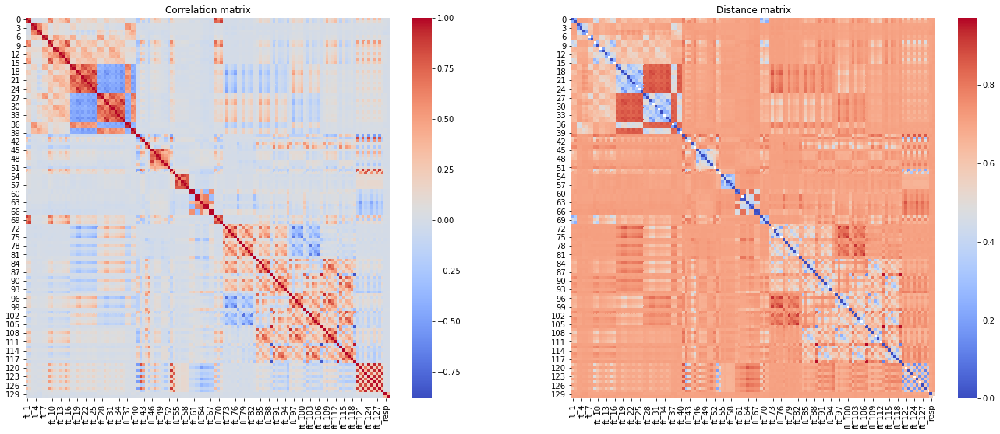

In [56]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(23,9))

sns.heatmap(corr_mat,ax= ax1, cmap='coolwarm');
sns.heatmap(dist,    ax= ax2, cmap='coolwarm');
ax1.title.set_text('Correlation matrix')
ax2.title.set_text('Distance matrix')
plt.show()

In [76]:
import networkx as nx
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import fcluster

# Complete graph from distance matrix
G = nx.from_numpy_matrix(dist.to_numpy())

labels = dist.columns.values
labels = [s.replace('ft_','') for s in labels]
G = nx.relabel_nodes(G, dict(zip(range(len(labels)), labels)))

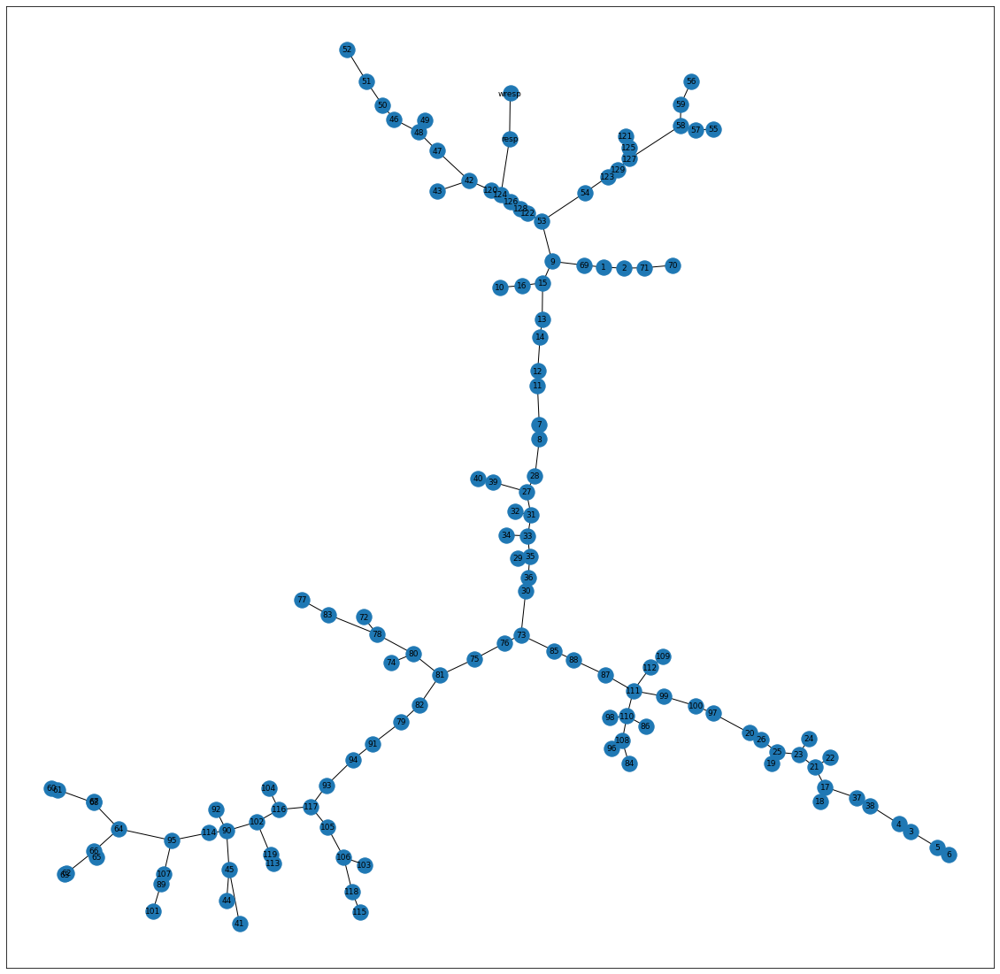

In [77]:
# Minimum spanning tree
T=nx.minimum_spanning_tree(G)

fig = plt.figure(figsize=(20,20))
nx.draw_networkx(T,
                 with_labels=True, 
                 font_size=9, 
                 cmap=plt.cm.coolwarm,
                 pos=nx.kamada_kawai_layout(T),vmin=0, vmax=1)
plt.show()

In [87]:
# Linkage matrix
link=sch.linkage(dist,'average')
link2=sch.linkage(dist,'complete')

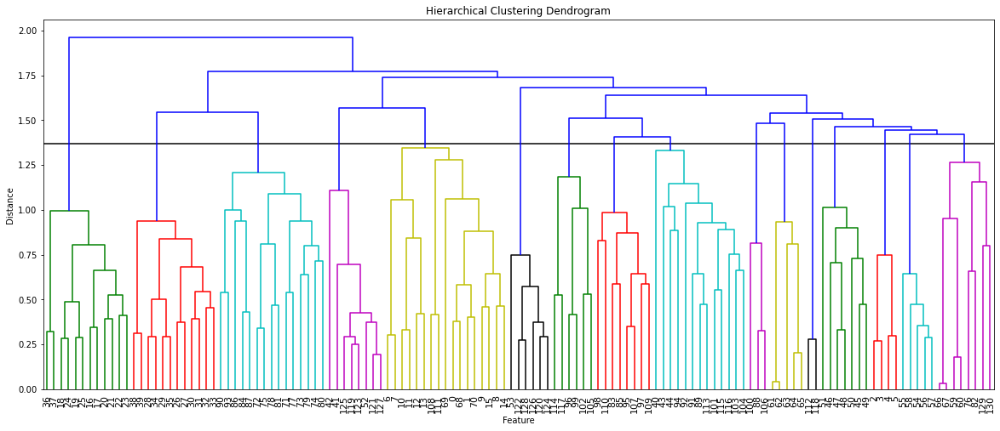

In [91]:
# Plot dendrogram

fig = plt.figure(figsize=(20, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Feature')
plt.ylabel('Distance')
plt.hlines(1.37,0,1320)
dn = sch.dendrogram(link,leaf_rotation=90.,leaf_font_size=11.)
plt.show()

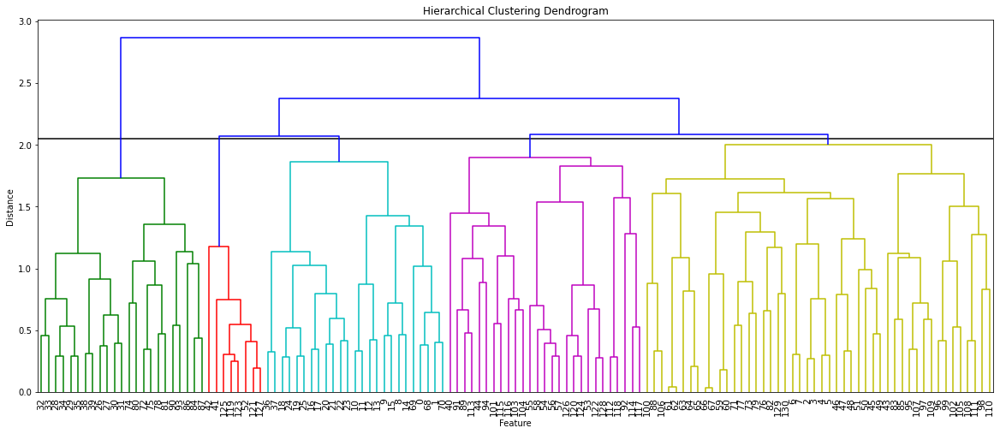

In [94]:
# Plot dendrogram

fig = plt.figure(figsize=(20, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Feature')
plt.ylabel('Distance')
plt.hlines(2.05,0,1320)
dn = sch.dendrogram(link2,leaf_rotation=90.,leaf_font_size=11.)
plt.show()

In [89]:
# fcluster forms flat clusters from the hierarchical clustering defined by the given linkage matrix.

max_d = 1.37
clusters = fcluster(link,t=max_d, criterion='distance')

In [95]:
# fcluster forms flat clusters from the hierarchical clustering defined by the given linkage matrix.

max_d = 2.05
clusters = fcluster(link2,t=max_d, criterion='distance')

In [96]:
df_clust = pd.DataFrame({'Cluster':clusters, 'Features':ft.columns.values.astype('str')})
df_clust.groupby('Cluster').count()

,Features
Cluster,
1,23
2,8
3,25
4,27
5,48


In [85]:
# Save the cluster-feature in a dictionary 
clust_feat = {}
for k in np.unique(clusters):
    clust_feat[k] = df_clust[df_clust.Cluster == k].Features.values

In [86]:
for k in np.unique(clusters):
    print('Cluster_{}'.format(k,2),'->', df_clust[df_clust.Cluster == k].Features.values)

Cluster_1 -> ['ft_17' 'ft_18' 'ft_19' 'ft_20' 'ft_21' 'ft_22' 'ft_23' 'ft_24' 'ft_25'
 'ft_26' 'ft_37' 'ft_38']
Cluster_2 -> ['ft_27' 'ft_28' 'ft_29' 'ft_30' 'ft_31' 'ft_32' 'ft_33' 'ft_34' 'ft_35'
 'ft_36' 'ft_39' 'ft_40']
Cluster_3 -> ['ft_72' 'ft_73' 'ft_74' 'ft_75' 'ft_76' 'ft_78' 'ft_79' 'ft_80' 'ft_81'
 'ft_82' 'ft_85' 'ft_87' 'ft_88' 'ft_91' 'ft_94']
Cluster_4 -> ['ft_42' 'ft_43' 'ft_53' 'ft_120' 'ft_122' 'ft_124' 'ft_126' 'ft_128']
Cluster_5 -> ['ft_1' 'ft_2' 'ft_7' 'ft_8' 'ft_9' 'ft_10' 'ft_11' 'ft_12' 'ft_13'
 'ft_14' 'ft_15' 'ft_16' 'ft_69' 'ft_70' 'ft_71' 'ft_109' 'ft_112']
Cluster_6 -> ['ft_54' 'ft_121' 'ft_123' 'ft_125' 'ft_127' 'ft_129']
Cluster_7 -> ['ft_97' 'ft_100' 'ft_103' 'ft_106' 'ft_115' 'ft_118']
Cluster_8 -> ['ft_84' 'ft_86' 'ft_96' 'ft_98' 'ft_99' 'ft_108' 'ft_110' 'ft_111']
Cluster_9 -> ['ft_41' 'ft_44' 'ft_45' 'ft_90' 'ft_92' 'ft_93' 'ft_95' 'ft_102' 'ft_104'
 'ft_105' 'ft_114' 'ft_116' 'ft_117']
Cluster_10 -> ['ft_89' 'ft_101' 'ft_107']
Cluster_11 -> ['ft_62

#### 1. Deleting before changing 'Trading Strategy'

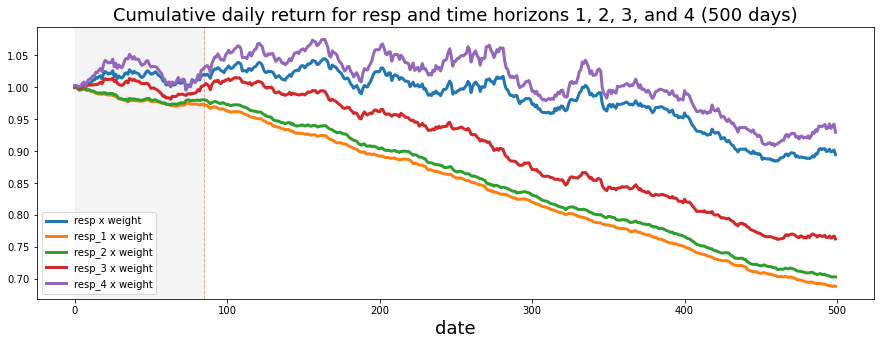

In [5]:
import matplotlib.pyplot as plt

df_train['weight_resp']   = df_train['weight']*df_train['resp']
df_train['weight_resp_1'] = df_train['weight']*df_train['resp_1']
df_train['weight_resp_2'] = df_train['weight']*df_train['resp_2']
df_train['weight_resp_3'] = df_train['weight']*df_train['resp_3']
df_train['weight_resp_4'] = df_train['weight']*df_train['resp_4']

fig, ax = plt.subplots(figsize=(15, 5))
resp    = pd.Series(1+(df_train.groupby('date')['weight_resp'].mean())).cumprod()
resp_1  = pd.Series(1+(df_train.groupby('date')['weight_resp_1'].mean())).cumprod()
resp_2  = pd.Series(1+(df_train.groupby('date')['weight_resp_2'].mean())).cumprod()
resp_3  = pd.Series(1+(df_train.groupby('date')['weight_resp_3'].mean())).cumprod()
resp_4  = pd.Series(1+(df_train.groupby('date')['weight_resp_4'].mean())).cumprod()
ax.set_xlabel ("Day", fontsize=18)
ax.set_title ("Cumulative daily return for resp and time horizons 1, 2, 3, and 4 (500 days)", fontsize=18)
resp.plot(lw=3, label='resp x weight')
resp_1.plot(lw=3, label='resp_1 x weight')
resp_2.plot(lw=3, label='resp_2 x weight')
resp_3.plot(lw=3, label='resp_3 x weight')
resp_4.plot(lw=3, label='resp_4 x weight')
# day 85 marker
ax.axvline(x=85, linestyle='--', alpha=0.3, c='red', lw=1)
ax.axvspan(0, 85 , color=sns.xkcd_rgb['grey'], alpha=0.1)
plt.legend(loc="lower left");

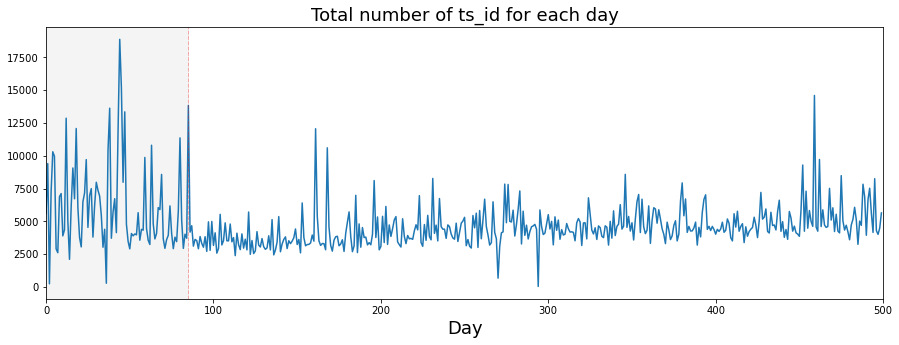

In [6]:
trades_per_day = df_train.groupby(['date'])['ts_id'].count()
fig, ax = plt.subplots(figsize=(15, 5))
plt.plot(trades_per_day)
ax.set_xlabel ("Day", fontsize=18)
ax.set_title ("Total number of ts_id for each day", fontsize=18)
# day 85 marker
ax.axvline(x=85, linestyle='--', alpha=0.3, c='red', lw=1)
ax.axvspan(0, 85 , color=sns.xkcd_rgb['grey'], alpha=0.1)
ax.set_xlim(xmin=0)
ax.set_xlim(xmax=500)
plt.show()

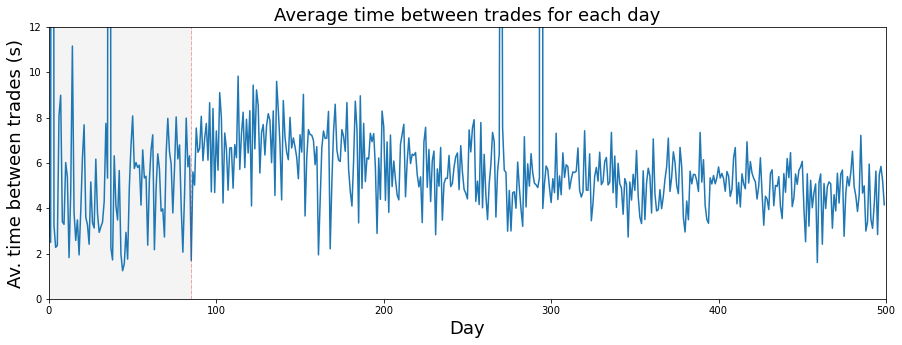

In [7]:
fig, ax = plt.subplots(figsize=(15, 5))
plt.plot(23400/trades_per_day)
ax.set_xlabel ("Day", fontsize=18)
ax.set_ylabel ("Av. time between trades (s)", fontsize=18)
ax.set_title ("Average time between trades for each day", fontsize=18)
ax.axvline(x=85, linestyle='--', alpha=0.3, c='red', lw=1)
ax.axvspan(0, 85 , color=sns.xkcd_rgb['grey'], alpha=0.1)
ax.set_xlim(xmin=0)
ax.set_xlim(xmax=500)
ax.set_ylim(ymin=0)
ax.set_ylim(ymax=12)
plt.show()

#### 2. Missing Value Distribution

NaN-Value has 'intra-day' pattern

https://www.kaggle.com/tomwarrens/nan-values-depending-on-time-of-day

In [11]:
day_0 = df_train.loc[df_train['date'] == 0]
day_1 = df_train.loc[df_train['date'] == 1]
day_3 = df_train.loc[df_train['date'] == 3]

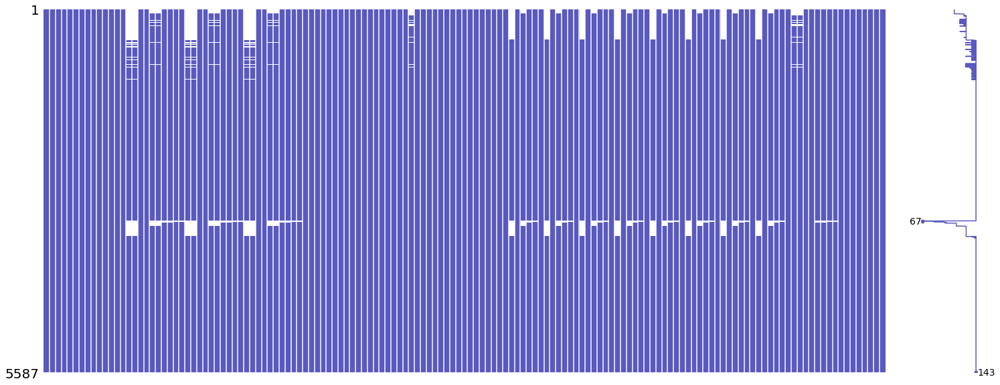

In [12]:
import missingno as msno

msno.matrix(day_0, color=(0.35, 0.35, 0.75));

In [ ]:
features = [ col for col in df_train.columns if "feature" in col ]
resps = [ col for col in df_train.columns if "resp" in col ]
target_resp = [resp_ for resp_ in resps if "_" not in resp_]
target = ["weight"] + target_resp + features 

In [ ]:
df_train = df_train.fillna(method='ffill').fillna(method='bfill')
df_train = df_train.loc[:,target]
df_train.loc[:,"action"] = df_train.resp.apply(lambda x: 1 if x>0 else 0)
df_train.head()

In [ ]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"

X = df_train.loc[:,features].values
y = df_train["action"].values

In [ ]:
class Timeseries_Dataset(Dataset):
    def __init__(self,X,y,seq_len=28):
        super(Timeseries_Dataset,self).__init__()
        self.X = X
        self.y = y
        self.seq_len = seq_len
        
    def __len__(self):
        return len(self.X) - (self.seq_len - 1) 
        
        
    def __getitem__(self,index):
        X = torch.tensor(self.X[index:index+self.seq_len], dtype=torch.float)
        # float for BCELoss
        y = torch.tensor(self.y[index+self.seq_len-1], dtype=torch.float)
        return X,y

In [ ]:
class LSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim):
        super(LSTM,self).__init__()
        self.hidden_dim = hidden_dim
        self.layer_dim = layer_dim
        self.lstm = nn.LSTM(input_dim, hidden_dim, layer_dim, batch_first=True)
        # self.fc = nn.Linear(hidden_dim,output_dim)
        
        # take sigmoid for BCELoss
        self.fc = nn.Sequential(
                      nn.Linear(hidden_dim,output_dim),
                      nn.Sigmoid()
                    )
        
    def forward(self, x):
        h0,c0 = self.init_state(x)
        output, (h_n, c_n) = self.lstm(x,(h0,c0))
        out = self.fc(output[:,-1,:])
        return out
        
    def init_state(self, x):
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).to(device)
        c0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).to(device)
        return h0, c0

In [ ]:
batch_size = 4096
learning_rate = 0.01
epochs = 1

seq_len = 31
input_dim = 130
hidden_dim = 256
layer_dim = 2
output_dim = 1

model = LSTM(input_dim, hidden_dim, layer_dim, output_dim)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(),lr=learning_rate)

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(X,y,test_size=0.2, shuffle=False)

train_dataset = Timeseries_Dataset(X_train, y_train, seq_len)
valid_dataset = Timeseries_Dataset(X_valid, y_valid, seq_len)

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False) 
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
train_score = defaultdict(list)
valid_score = defaultdict(list)

model = model.to(device)
best_auc = 0

IS_CONTIN = False

file_name = f"LSTM_{input_dim}_{hidden_dim}_{layer_dim}.pth"
model_file_path = os.path.join(project_home, file_name)

if ~IS_CONTIN:
    if os.path.isfile(model_file_path):
        os.remove(model_file_path)
else:
    model.load_state_dict(torch.load(model_file_path))

for epoch in tqdm_notebook(range(epochs)):

    train_acc = 0
    train_auc = 0

    valid_acc = 0
    valid_auc = 0

    for idx, (inputs, label) in enumerate(train_dataloader):
        model.train()
        optimizer.zero_grad()

        inputs = inputs.to(device)
        label = label.to(device).unsqueeze(1)
        
        outputs = model(inputs)
        loss = criterion(outputs,label)
        loss.backward()
        optimizer.step()

        train_preds = np.array(list(map(lambda x: 1 if x > 0.5 else 0,outputs.cpu().detach().numpy())))

        train_batch_acc = (np.concatenate(label.cpu().detach().numpy()) == train_preds).sum() / inputs.size(0)
        train_batch_auc = roc_auc_score(label.cpu().detach().numpy(), outputs.cpu().detach().numpy())

        train_acc += train_batch_acc / len(train_dataloader)
        train_auc += train_batch_auc / len(train_dataloader)

    train_score["acc"].append(train_acc)
    train_score["auc"].append(train_auc)

    with torch.no_grad():
        model.eval()
        for idx, (inputs, label) in enumerate(valid_dataloader):

            inputs = inputs.to(device)
            label = label.to(device).unsqueeze(1)

            outputs = model(inputs)

            valid_preds = np.array(list(map(lambda x: 1 if x > 0.5 else 0,outputs.cpu().detach().numpy())))

            valid_batch_acc = (np.concatenate(label.cpu().detach().numpy()) == valid_preds).sum() / inputs.size(0)
            valid_batch_auc = roc_auc_score(label.cpu().detach().numpy(), outputs.cpu().detach().numpy())

            valid_acc += valid_batch_acc / len(valid_dataloader)
            valid_auc += valid_batch_auc / len(valid_dataloader)

    print(f"EPOCH:{epoch+1}|{epochs}; ACC(train/valid):{train_acc:.4f}/{valid_acc:.4f}; ROC_AUC(train/valid):{train_auc:.4f}/{valid_auc:.4f}")
    
    valid_score["acc"].append(valid_acc)
    valid_score["auc"].append(valid_auc)

    if valid_auc > best_auc:
        print(f"best model changed {best_auc:.4f} -> {valid_auc:.4f}")
        best_model_state = deepcopy(model.state_dict())
#         torch.save(best_model_state, model_file_path)
        best_auc = valid_auc

model.load_state_dict(best_model_state)

In [ ]:
import janestreet

model.eval()
X_test = None
env = janestreet.make_env()
env_iter = env.iter_test()
for (idx,(test_df, pred_df)) in enumerate(tqdm_notebook(env_iter)):
    if test_df['weight'].item() > 0:
        test_df = pd.DataFrame(test_df, columns=features)

        if X_test is None:
            test_df = test_df.fillna(0)
            X_test = pd.concat([test_df for _ in range(seq_len)],axis=0)
            
        X_test = pd.concat([X_test.iloc[1:], test_df] ,axis=0)
        X_test = X_test.fillna(method='ffill').fillna(method='bfill')
        preds = model(torch.tensor(X_test.values[np.newaxis,:], dtype=torch.float).to(device))
        preds = preds.cpu().detach().numpy()
        action = 1 if preds > 0.5 else 0
        pred_df.action = action
    else:
        pred_df.action = 0
    env.predict(pred_df)